# Test Notebook for developments of proper steering for nifty+maria

2024-11-27 10:15:50.154 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-11-27 10:15:50.155 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


Initialising...


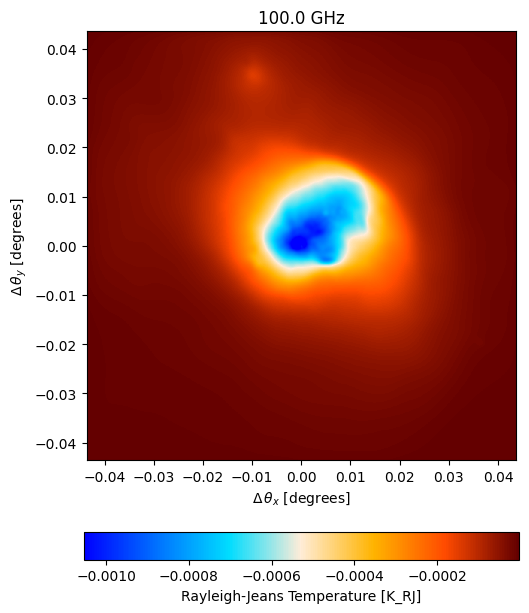

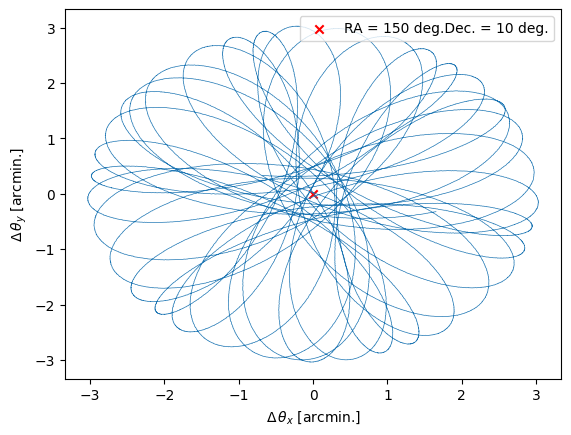

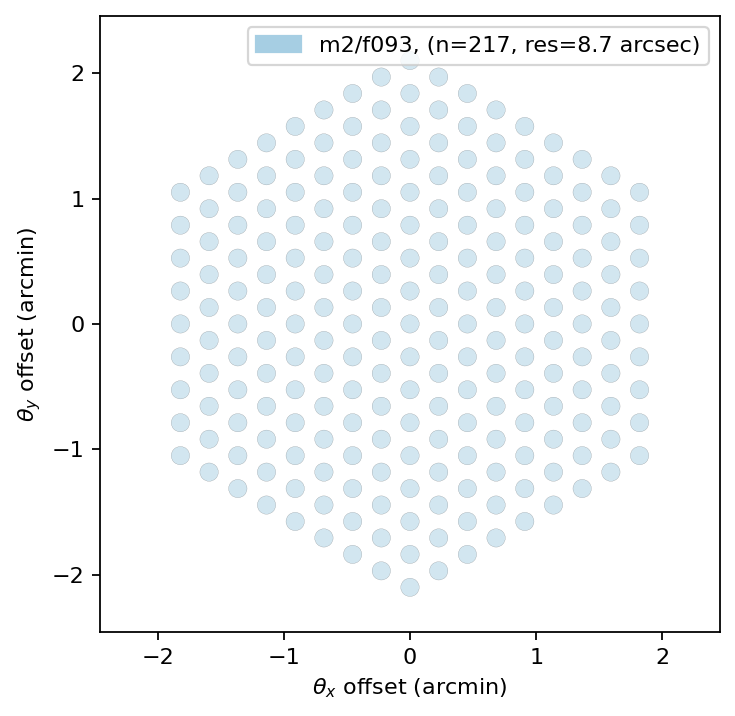

In [1]:
from nifty_maria.FitHandler import FitHandler

fit = FitHandler(config='mustang')

In [2]:
fit.simulate()

2024-11-27 10:15:52.613 INFO: Initialized base in 1685 ms.
Building atmosphere: 100%|██████████| 6/6 [00:04<00:00,  1.24it/s]
2024-11-27 10:15:58.963 INFO: Initialized atmosphere in 6334 ms.
Generating noise: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Running mapper (m2/f093): 100%|██████████| 1/1 [00:06<00:00,  6.24s/it]


mapdata_truth shape: (1, 1, 1000, 1000)
mapdata_truth mean: -8.726028151723567e-05


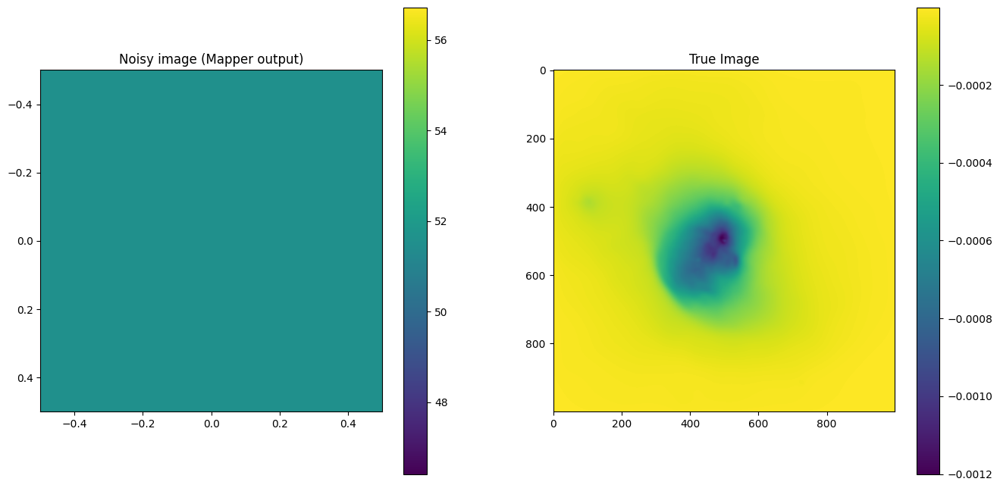

Running mapper (m2/f093): 100%|██████████| 1/1 [00:13<00:00, 13.58s/it]


In [3]:
fit.reco_maria()

# JAX

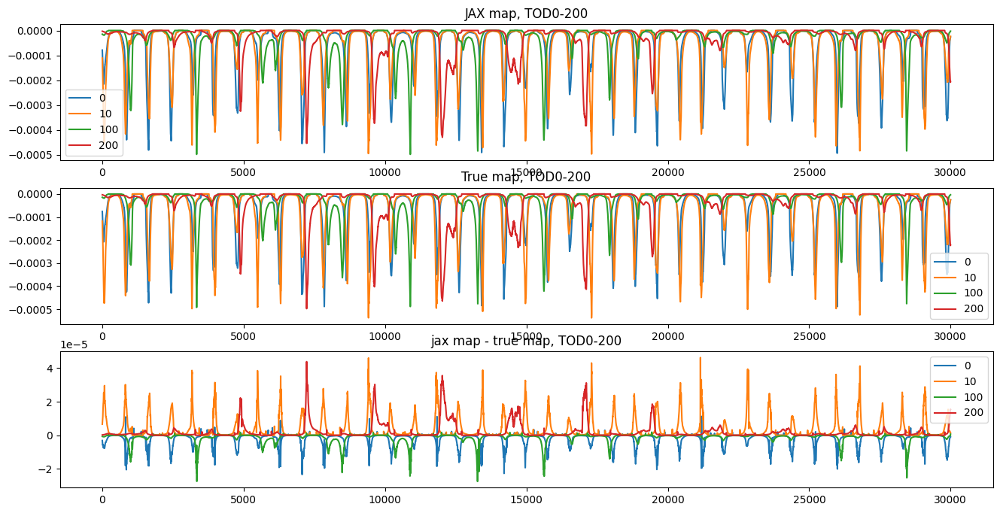

Noise stddev: 0.0002519824251291972


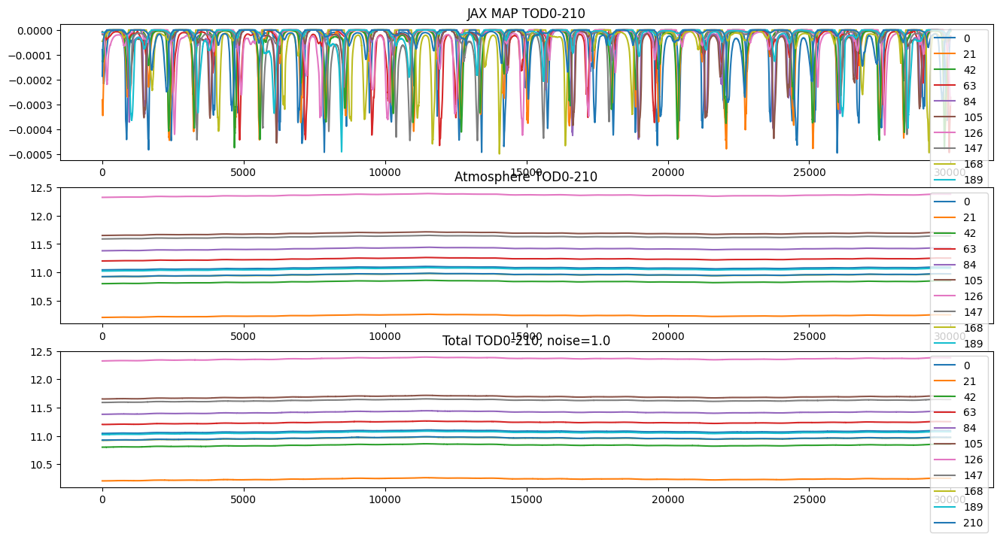

In [4]:
fit.sample_jax_tods()

In [5]:
fit.init_gps()

(2, 217)


Initialised gp_tod: Model(
	<function CFM.finalize.<locals>.correlated_field at 0x1520781ed120>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x15214ecaa480>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x15214ecaa480>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x15214ecaa480>, primals=ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>)),
		 'combcf zeromode': functools.partial(<function ra

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


(217, 30000)


Array([[11.07874354, 11.07874741, 11.07875377, ..., 11.07946704,
        11.07945782, 11.07945594],
       [11.11565127, 11.11565332, 11.11565876, ..., 11.11636585,
        11.11635806, 11.1163583 ],
       [10.59475375, 10.59475128, 10.59475406, ..., 10.59541797,
        10.59540876, 10.59540591],
       ...,
       [11.07566668, 11.07566922, 11.07567494, ..., 11.07642129,
        11.07641354, 11.0764133 ],
       [11.9280549 , 11.92806057, 11.9280693 , ..., 11.92888005,
        11.92887251, 11.92887304],
       [10.6556088 , 10.65560755, 10.65561415, ..., 10.65632171,
        10.656317  , 10.65632025]], dtype=float64)

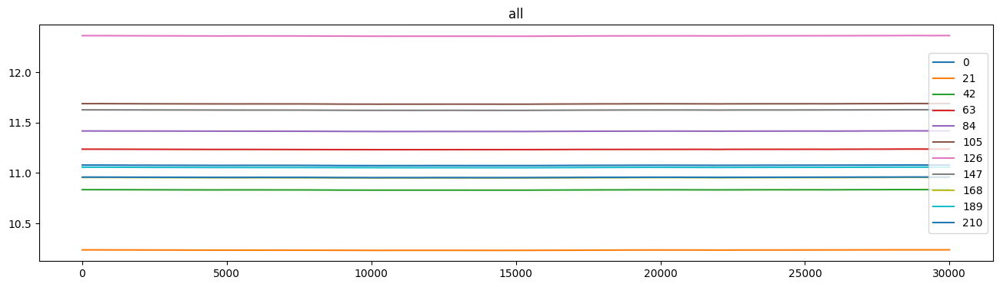

In [6]:
fit.draw_prior_sample()

In [7]:
samples, state = fit.perform_fit(fit_type = 'map')

OPTIMIZE_KL: Starting 0001
M: →:1.0 ↺:False #∇²:06 |↘|:1.657220e+02 ➽:1.060106e+02
M: Iteration 1 ⛰:+5.559659e+08 Δ⛰:1.666964e+10
M: →:1.0 ↺:False #∇²:12 |↘|:1.274579e+02 ➽:1.060106e+02
M: Iteration 2 ⛰:+4.612338e+08 Δ⛰:9.473204e+07
M: →:1.0 ↺:False #∇²:18 |↘|:8.275767e+01 ➽:1.060106e+02
M: Iteration 3 ⛰:+1.173030e+08 Δ⛰:3.439308e+08
OPTIMIZE_KL: Iteration 0001 ⛰:+1.1730e+08
OPTIMIZE_KL: #(KL minimization steps) 3
OPTIMIZE_KL: Likelihood residual(s):
'reduced χ²: 3.6e+01±     0.0, avg:    +0.29±     0.0, #dof:6510000'

OPTIMIZE_KL: Prior residual(s):
cfmapax1fluctuations    :: 'reduced χ²: 0.00011±     0.0, avg:    -0.01±     0.0, #dof:      1'
cfmapax1loglogavgslope  :: 'reduced χ²:   0.029±     0.0, avg:    -0.17±     0.0, #dof:      1'
cfmapxi                 :: 'reduced χ²:    0.01±     0.0, avg: +5.5e-05±     0.0, #dof:1020100'
cfmapzeromode           :: 'reduced χ²:  0.0017±     0.0, avg:   -0.041±     0.0, #dof:      1'
combcf tod fluctuations :: 'reduced χ²:    0.85±     0.0, a

In [8]:
fit.printfitresults(samples)

Fit Results (res, init, std)

TODs:
	fluctuations: 0.0014073056583956778, 0.0015, 0.0001
	loglogvarslope: -1.5488253652146158, -2.45, 0.1
	zeromode std (LogNormal): 6.1841473472409645e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.598080701784496e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.5169309083327955, -2.5, 0.1
	zeromode std (LogNormal): 9.113840555552717e-10, 1e-08, 1e-07


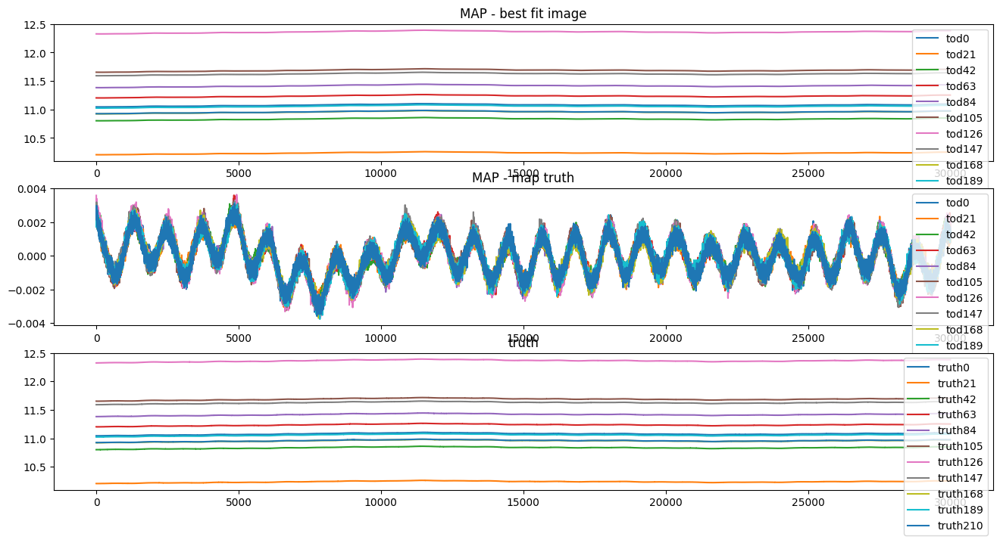

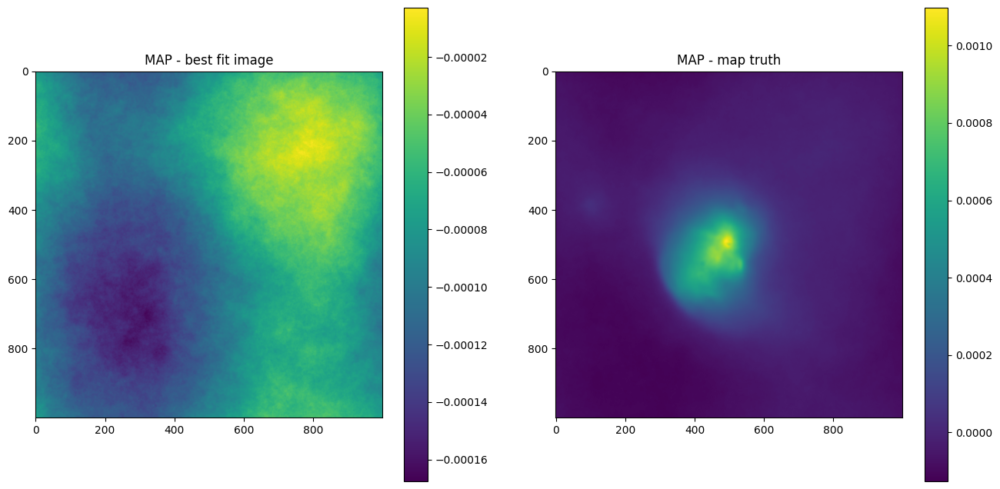

In [9]:
fit.plotfitresults(samples)

# Full fit

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+4.2868e+08 Δ⛰:inf ➽:1.0601e+01
SL: Iteration 1 ⛰:+4.8899e+07 Δ⛰:3.7978e+08 ➽:1.0601e+01
SL: Iteration 2 ⛰:+2.9908e+07 Δ⛰:1.8991e+07 ➽:1.0601e+01
SL: Iteration 3 ⛰:+1.3489e+07 Δ⛰:1.6419e+07 ➽:1.0601e+01
SL: Iteration 4 ⛰:+8.0589e+06 Δ⛰:5.4298e+06 ➽:1.0601e+01
SL: Iteration 5 ⛰:+6.2275e+06 Δ⛰:1.8313e+06 ➽:1.0601e+01
SL: Iteration 6 ⛰:+3.2744e+06 Δ⛰:2.9531e+06 ➽:1.0601e+01
SL: Iteration 7 ⛰:+2.0904e+06 Δ⛰:1.1840e+06 ➽:1.0601e+01
SL: Iteration 8 ⛰:+1.5291e+06 Δ⛰:5.6132e+05 ➽:1.0601e+01
SL: Iteration 9 ⛰:+1.1800e+06 Δ⛰:3.4908e+05 ➽:1.0601e+01
SL: Iteration 10 ⛰:+7.8893e+05 Δ⛰:3.9110e+05 ➽:1.0601e+01
SL: Iteration 11 ⛰:+6.0972e+05 Δ⛰:1.7921e+05 ➽:1.0601e+01
SL: Iteration 12 ⛰:+5.5601e+05 Δ⛰:5.3713e+04 ➽:1.0601e+01
SL: Iteration 13 ⛰:+3.5127e+05 Δ⛰:2.0473e+05 ➽:1.0601e+01
SL: Iteration 14 ⛰:+3.4659e+05 Δ⛰:4.6799e+03 ➽:1.0601e+01
SL: Iteration 15 ⛰:+2.5732e+05 Δ⛰:8.9275e+04 ➽:1.0601e+01
SL: Iteration 16 ⛰:+7.8930e+04 Δ⛰:1.7839e+05 ➽:1.0601e+01
SL: 

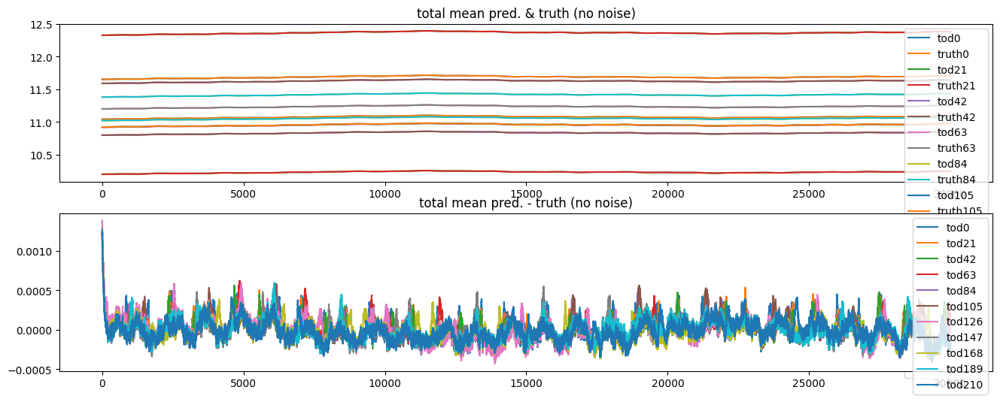

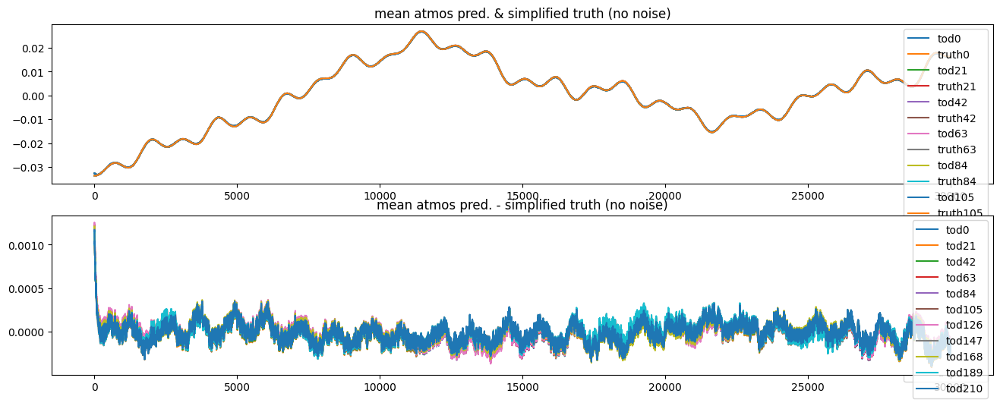

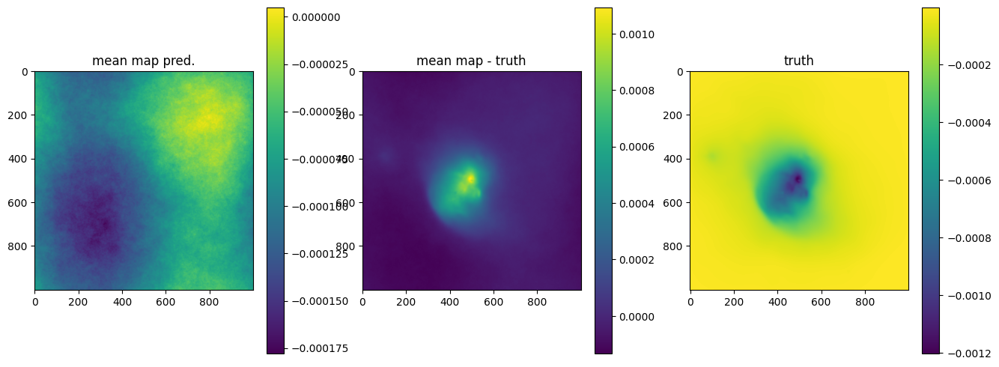

OPTIMIZE_KL: Starting 0004
SL: Iteration 0 ⛰:+3.9916e+08 Δ⛰:inf ➽:1.0601e+01
SL: Iteration 1 ⛰:+2.3050e+08 Δ⛰:1.6867e+08 ➽:1.0601e+01
SL: Iteration 2 ⛰:+1.3435e+08 Δ⛰:9.6151e+07 ➽:1.0601e+01
SL: Iteration 3 ⛰:+8.6112e+07 Δ⛰:4.8236e+07 ➽:1.0601e+01
SL: Iteration 4 ⛰:+6.3757e+07 Δ⛰:2.2355e+07 ➽:1.0601e+01
SL: Iteration 5 ⛰:+5.0040e+07 Δ⛰:1.3716e+07 ➽:1.0601e+01
SL: Iteration 6 ⛰:+4.0678e+07 Δ⛰:9.3626e+06 ➽:1.0601e+01
SL: Iteration 7 ⛰:+3.3475e+07 Δ⛰:7.2028e+06 ➽:1.0601e+01
SL: Iteration 8 ⛰:+3.0167e+07 Δ⛰:3.3077e+06 ➽:1.0601e+01
SL: Iteration 9 ⛰:+2.7061e+07 Δ⛰:3.1064e+06 ➽:1.0601e+01
SL: Iteration 10 ⛰:+2.4214e+07 Δ⛰:2.8465e+06 ➽:1.0601e+01
SL: Iteration 11 ⛰:+2.4017e+07 Δ⛰:1.9742e+05 ➽:1.0601e+01
SL: Iteration 12 ⛰:+2.2775e+07 Δ⛰:1.2419e+06 ➽:1.0601e+01
SL: Iteration 13 ⛰:+2.1120e+07 Δ⛰:1.6555e+06 ➽:1.0601e+01
SL: Iteration 14 ⛰:+1.9281e+07 Δ⛰:1.8383e+06 ➽:1.0601e+01
SL: Iteration 15 ⛰:+1.8102e+07 Δ⛰:1.1795e+06 ➽:1.0601e+01
SL: Iteration 16 ⛰:+1.6957e+07 Δ⛰:1.1444e+06 ➽:1.0601e+01
SL: 

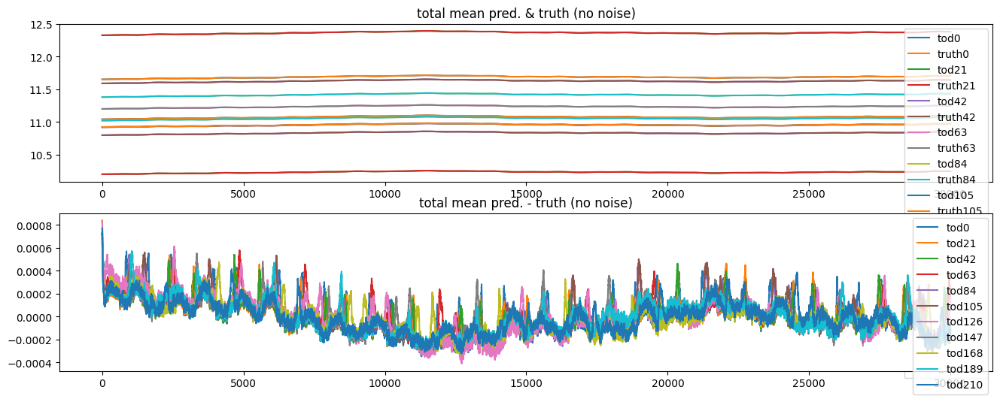

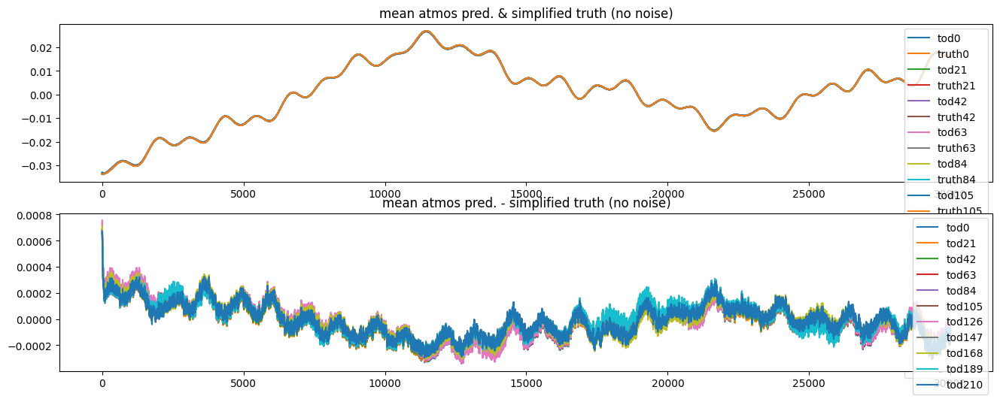

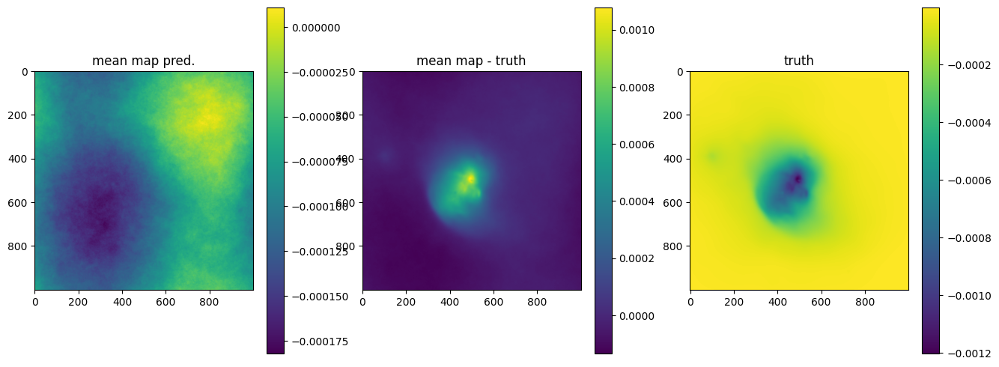

OPTIMIZE_KL: Starting 0007
SL: Iteration 0 ⛰:+3.1516e+08 Δ⛰:inf ➽:1.0601e+01
SL: Iteration 1 ⛰:+1.6857e+08 Δ⛰:1.4659e+08 ➽:1.0601e+01
SL: Iteration 2 ⛰:+8.9676e+07 Δ⛰:7.8892e+07 ➽:1.0601e+01
SL: Iteration 3 ⛰:+5.0333e+07 Δ⛰:3.9343e+07 ➽:1.0601e+01
SL: Iteration 4 ⛰:+3.5234e+07 Δ⛰:1.5100e+07 ➽:1.0601e+01
SL: Iteration 5 ⛰:+3.0747e+07 Δ⛰:4.4864e+06 ➽:1.0601e+01
SL: Iteration 6 ⛰:+2.5184e+07 Δ⛰:5.5636e+06 ➽:1.0601e+01
SL: Iteration 7 ⛰:+2.1063e+07 Δ⛰:4.1212e+06 ➽:1.0601e+01
SL: Iteration 8 ⛰:+1.8714e+07 Δ⛰:2.3483e+06 ➽:1.0601e+01
SL: Iteration 9 ⛰:+1.6850e+07 Δ⛰:1.8647e+06 ➽:1.0601e+01
SL: Iteration 10 ⛰:+1.5067e+07 Δ⛰:1.7830e+06 ➽:1.0601e+01
SL: Iteration 11 ⛰:+1.3027e+07 Δ⛰:2.0391e+06 ➽:1.0601e+01
SL: Iteration 12 ⛰:+1.1925e+07 Δ⛰:1.1021e+06 ➽:1.0601e+01
SL: Iteration 13 ⛰:+1.1820e+07 Δ⛰:1.0523e+05 ➽:1.0601e+01
SL: Iteration 14 ⛰:+1.0322e+07 Δ⛰:1.4982e+06 ➽:1.0601e+01
SL: Iteration 15 ⛰:+9.4341e+06 Δ⛰:8.8785e+05 ➽:1.0601e+01
SL: Iteration 16 ⛰:+8.6774e+06 Δ⛰:7.5676e+05 ➽:1.0601e+01
SL: 

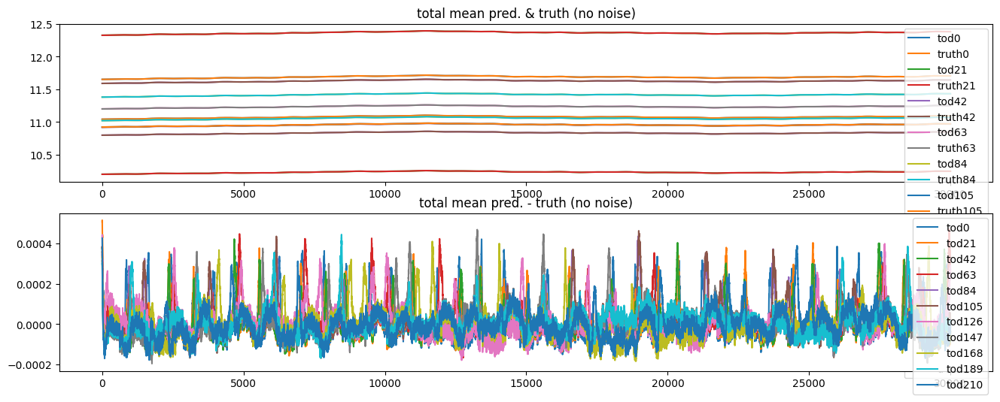

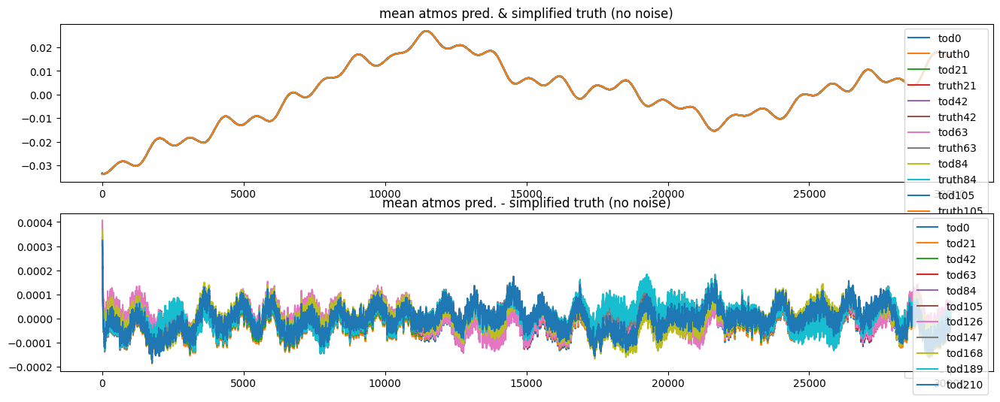

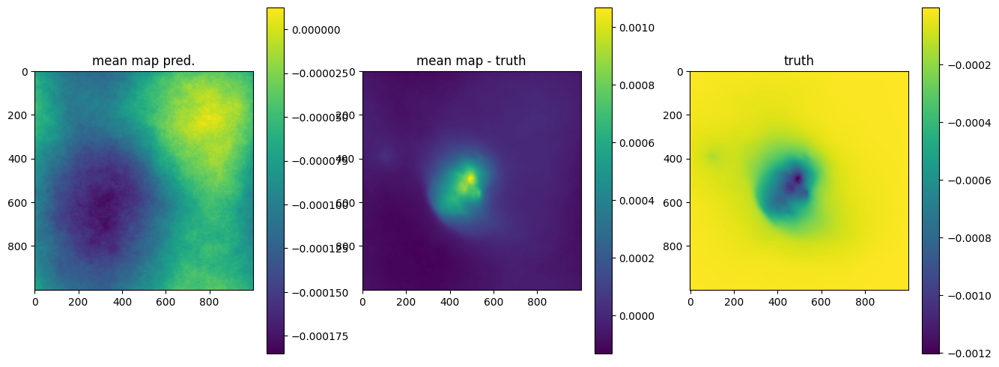

OPTIMIZE_KL: Starting 0010
SL: Iteration 0 ⛰:+4.5398e+08 Δ⛰:inf ➽:1.0601e+01
SL: Iteration 1 ⛰:+9.8368e+07 Δ⛰:3.5561e+08 ➽:1.0601e+01
SL: Iteration 2 ⛰:+7.6513e+07 Δ⛰:2.1855e+07 ➽:1.0601e+01
SL: Iteration 3 ⛰:+5.7782e+07 Δ⛰:1.8731e+07 ➽:1.0601e+01
SL: Iteration 4 ⛰:+4.2405e+07 Δ⛰:1.5377e+07 ➽:1.0601e+01
SL: Iteration 5 ⛰:+3.1343e+07 Δ⛰:1.1062e+07 ➽:1.0601e+01
SL: Iteration 6 ⛰:+2.4247e+07 Δ⛰:7.0963e+06 ➽:1.0601e+01
SL: Iteration 7 ⛰:+1.8208e+07 Δ⛰:6.0389e+06 ➽:1.0601e+01
SL: Iteration 8 ⛰:+1.5680e+07 Δ⛰:2.5284e+06 ➽:1.0601e+01
SL: Iteration 9 ⛰:+1.4301e+07 Δ⛰:1.3784e+06 ➽:1.0601e+01
SL: Iteration 10 ⛰:+1.1814e+07 Δ⛰:2.4877e+06 ➽:1.0601e+01
SL: Iteration 11 ⛰:+1.0868e+07 Δ⛰:9.4530e+05 ➽:1.0601e+01
SL: Iteration 12 ⛰:+9.2433e+06 Δ⛰:1.6250e+06 ➽:1.0601e+01
SL: Iteration 13 ⛰:+8.9441e+06 Δ⛰:2.9923e+05 ➽:1.0601e+01
SL: Iteration 14 ⛰:+8.5453e+06 Δ⛰:3.9883e+05 ➽:1.0601e+01
SL: Iteration 15 ⛰:+7.7415e+06 Δ⛰:8.0377e+05 ➽:1.0601e+01
SL: Iteration 16 ⛰:+7.2441e+06 Δ⛰:4.9738e+05 ➽:1.0601e+01
SL: 

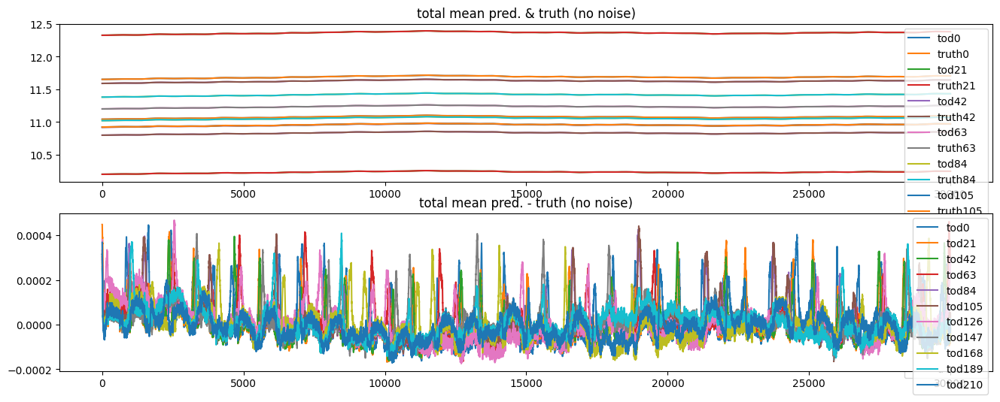

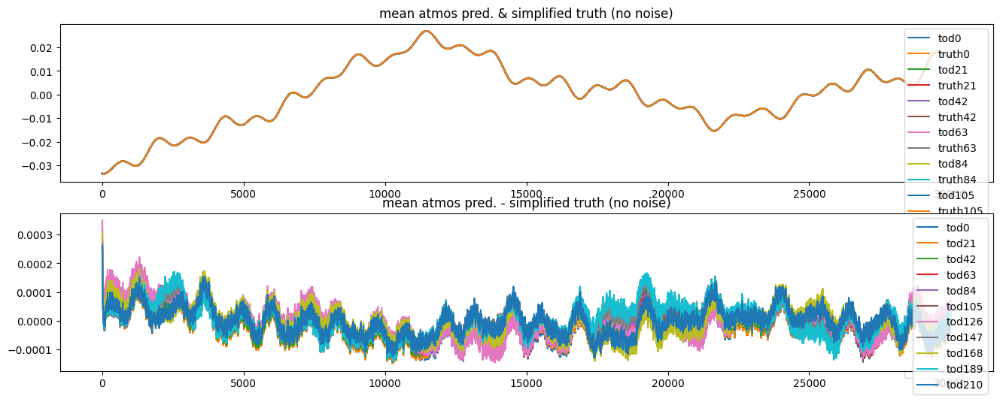

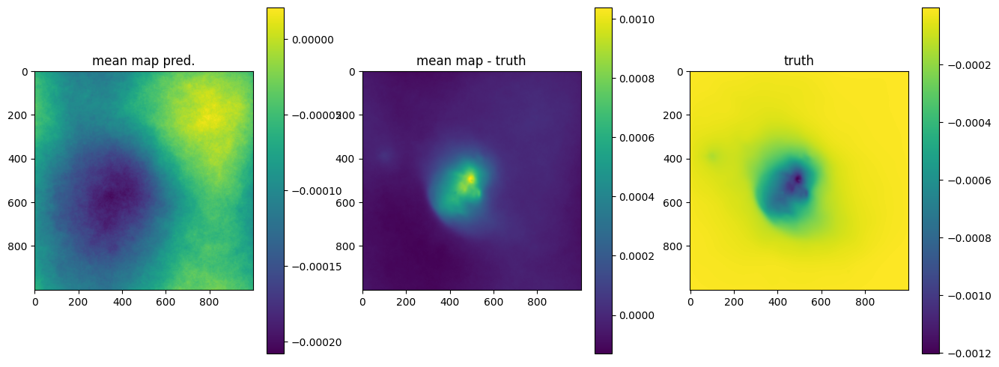

OPTIMIZE_KL: Starting 0013
SL: Iteration 0 ⛰:+3.6243e+08 Δ⛰:inf ➽:1.0601e+01
SL: Iteration 1 ⛰:+1.3990e+08 Δ⛰:2.2253e+08 ➽:1.0601e+01
SL: Iteration 2 ⛰:+8.0833e+07 Δ⛰:5.9067e+07 ➽:1.0601e+01
SL: Iteration 3 ⛰:+6.1217e+07 Δ⛰:1.9617e+07 ➽:1.0601e+01
SL: Iteration 4 ⛰:+3.9753e+07 Δ⛰:2.1464e+07 ➽:1.0601e+01
SL: Iteration 5 ⛰:+2.4896e+07 Δ⛰:1.4856e+07 ➽:1.0601e+01
SL: Iteration 6 ⛰:+1.9044e+07 Δ⛰:5.8524e+06 ➽:1.0601e+01
SL: Iteration 7 ⛰:+1.4774e+07 Δ⛰:4.2699e+06 ➽:1.0601e+01
SL: Iteration 8 ⛰:+1.1954e+07 Δ⛰:2.8197e+06 ➽:1.0601e+01
SL: Iteration 9 ⛰:+1.0530e+07 Δ⛰:1.4238e+06 ➽:1.0601e+01
SL: Iteration 10 ⛰:+9.2522e+06 Δ⛰:1.2782e+06 ➽:1.0601e+01
SL: Iteration 11 ⛰:+7.9055e+06 Δ⛰:1.3468e+06 ➽:1.0601e+01
SL: Iteration 12 ⛰:+6.5836e+06 Δ⛰:1.3219e+06 ➽:1.0601e+01
SL: Iteration 13 ⛰:+6.0084e+06 Δ⛰:5.7522e+05 ➽:1.0601e+01
SL: Iteration 14 ⛰:+5.5835e+06 Δ⛰:4.2482e+05 ➽:1.0601e+01
SL: Iteration 15 ⛰:+5.2118e+06 Δ⛰:3.7171e+05 ➽:1.0601e+01
SL: Iteration 16 ⛰:+5.1497e+06 Δ⛰:6.2111e+04 ➽:1.0601e+01
SL: 

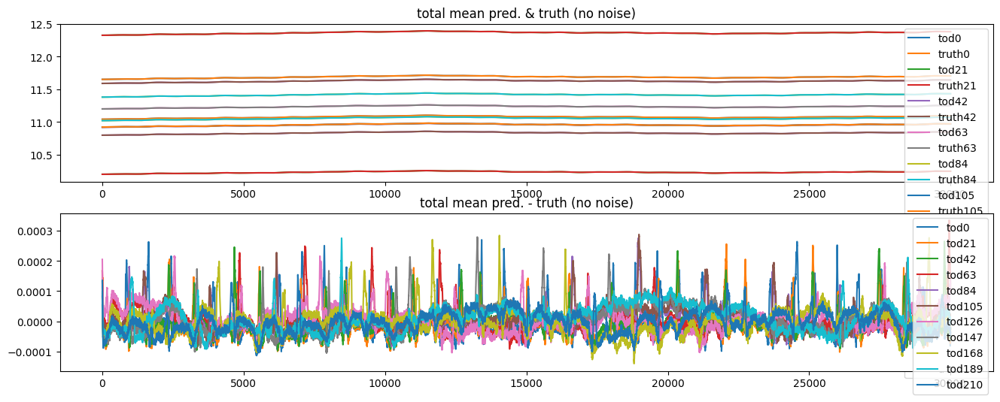

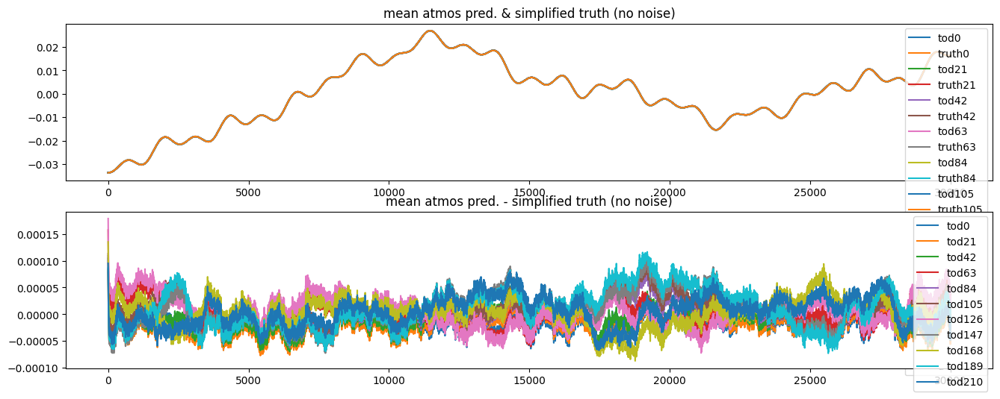

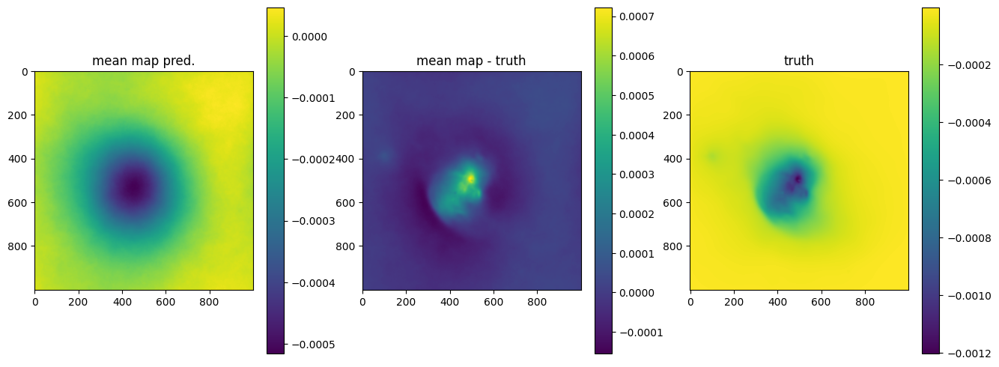

OPTIMIZE_KL: Starting 0016
SL: Iteration 0 ⛰:+1.1371e+08 Δ⛰:inf ➽:1.0601e+01
SL: Iteration 1 ⛰:+4.1881e+07 Δ⛰:7.1833e+07 ➽:1.0601e+01
SL: Iteration 2 ⛰:+2.6450e+07 Δ⛰:1.5431e+07 ➽:1.0601e+01
SL: Iteration 3 ⛰:+1.7295e+07 Δ⛰:9.1550e+06 ➽:1.0601e+01
SL: Iteration 4 ⛰:+1.4822e+07 Δ⛰:2.4733e+06 ➽:1.0601e+01
SL: Iteration 5 ⛰:+1.2317e+07 Δ⛰:2.5049e+06 ➽:1.0601e+01
SL: Iteration 6 ⛰:+8.9367e+06 Δ⛰:3.3801e+06 ➽:1.0601e+01
SL: Iteration 7 ⛰:+7.5888e+06 Δ⛰:1.3479e+06 ➽:1.0601e+01
SL: Iteration 8 ⛰:+6.3747e+06 Δ⛰:1.2140e+06 ➽:1.0601e+01
SL: Iteration 9 ⛰:+5.7146e+06 Δ⛰:6.6015e+05 ➽:1.0601e+01
SL: Iteration 10 ⛰:+4.8792e+06 Δ⛰:8.3535e+05 ➽:1.0601e+01
SL: Iteration 11 ⛰:+4.0431e+06 Δ⛰:8.3607e+05 ➽:1.0601e+01
SL: Iteration 12 ⛰:+2.9821e+06 Δ⛰:1.0611e+06 ➽:1.0601e+01
SL: Iteration 13 ⛰:+2.3890e+06 Δ⛰:5.9311e+05 ➽:1.0601e+01
SL: Iteration 14 ⛰:+2.3798e+06 Δ⛰:9.1583e+03 ➽:1.0601e+01
SL: Iteration 15 ⛰:+2.2994e+06 Δ⛰:8.0375e+04 ➽:1.0601e+01
SL: Iteration 16 ⛰:+2.1888e+06 Δ⛰:1.1059e+05 ➽:1.0601e+01
SL: 

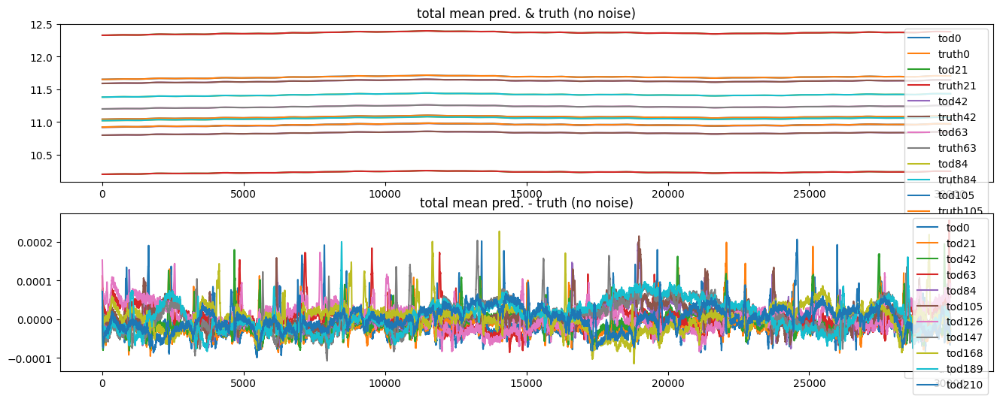

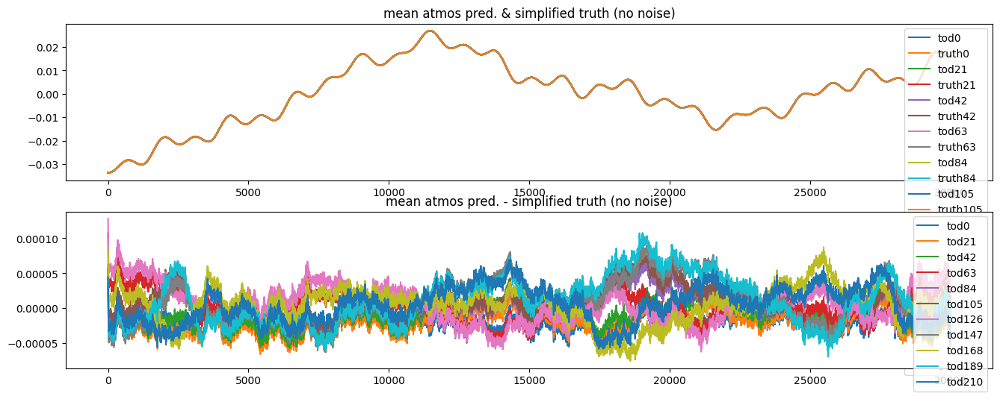

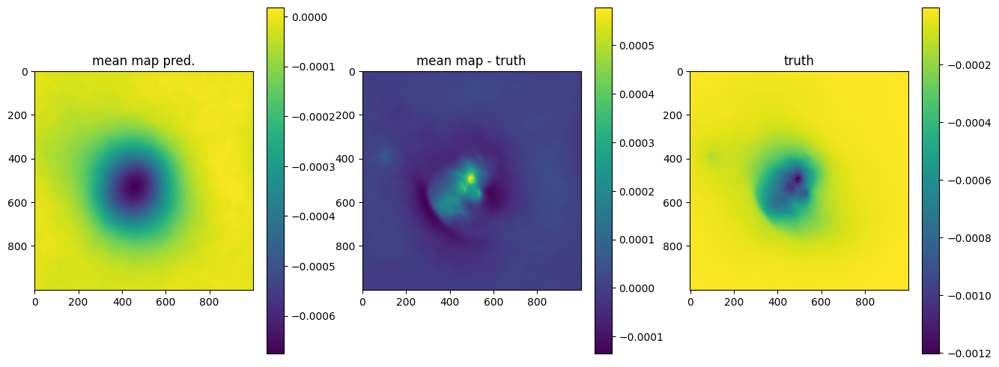

OPTIMIZE_KL: Starting 0019
SL: Iteration 0 ⛰:+6.9192e+07 Δ⛰:inf ➽:1.0601e+01
SL: Iteration 1 ⛰:+5.4143e+07 Δ⛰:1.5048e+07 ➽:1.0601e+01
SL: Iteration 2 ⛰:+2.9619e+07 Δ⛰:2.4524e+07 ➽:1.0601e+01
SL: Iteration 3 ⛰:+2.4274e+07 Δ⛰:5.3448e+06 ➽:1.0601e+01
SL: Iteration 4 ⛰:+1.5513e+07 Δ⛰:8.7615e+06 ➽:1.0601e+01
SL: Iteration 5 ⛰:+1.3272e+07 Δ⛰:2.2405e+06 ➽:1.0601e+01
SL: Iteration 6 ⛰:+7.6673e+06 Δ⛰:5.6050e+06 ➽:1.0601e+01
SL: Iteration 7 ⛰:+6.3796e+06 Δ⛰:1.2876e+06 ➽:1.0601e+01
SL: Iteration 8 ⛰:+4.9328e+06 Δ⛰:1.4469e+06 ➽:1.0601e+01
SL: Iteration 9 ⛰:+3.8351e+06 Δ⛰:1.0976e+06 ➽:1.0601e+01
SL: Iteration 10 ⛰:+3.1243e+06 Δ⛰:7.1081e+05 ➽:1.0601e+01
SL: Iteration 11 ⛰:+2.6120e+06 Δ⛰:5.1238e+05 ➽:1.0601e+01
SL: Iteration 12 ⛰:+1.9092e+06 Δ⛰:7.0274e+05 ➽:1.0601e+01
SL: Iteration 13 ⛰:+1.8856e+06 Δ⛰:2.3637e+04 ➽:1.0601e+01
SL: Iteration 14 ⛰:+1.7504e+06 Δ⛰:1.3520e+05 ➽:1.0601e+01
SL: Iteration 15 ⛰:+1.6227e+06 Δ⛰:1.2766e+05 ➽:1.0601e+01
SL: Iteration 16 ⛰:+1.4218e+06 Δ⛰:2.0088e+05 ➽:1.0601e+01
SL: 

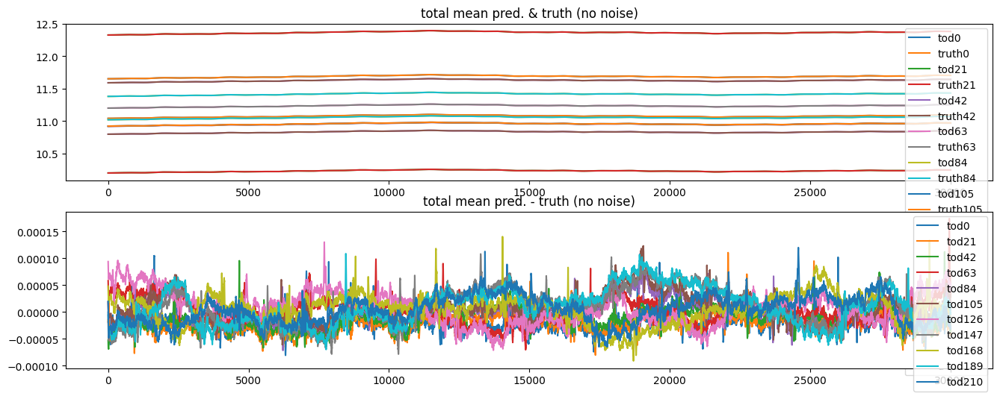

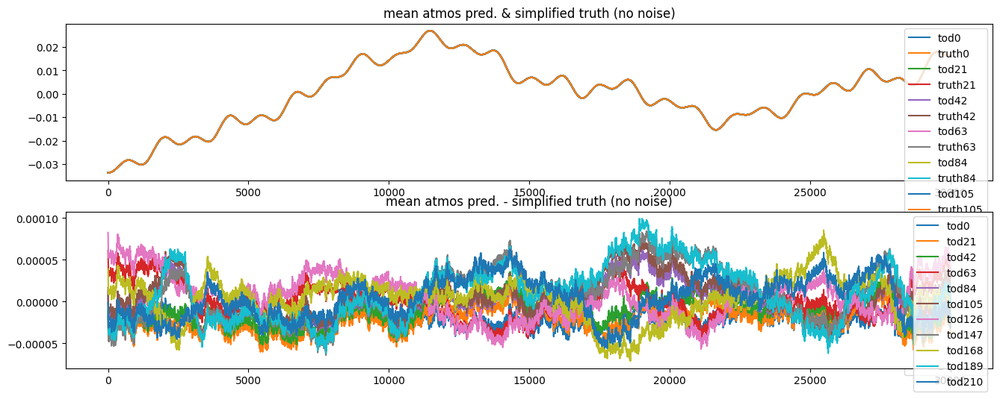

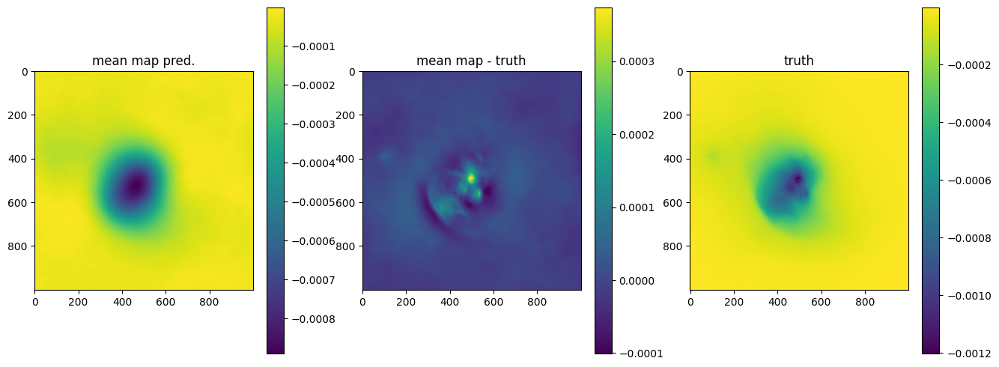

OPTIMIZE_KL: Starting 0022
SL: Iteration 0 ⛰:+4.3885e+08 Δ⛰:inf ➽:1.0601e+01
SL: Iteration 1 ⛰:+1.0556e+08 Δ⛰:3.3329e+08 ➽:1.0601e+01
SL: Iteration 2 ⛰:+5.6079e+07 Δ⛰:4.9476e+07 ➽:1.0601e+01
SL: Iteration 3 ⛰:+1.9707e+07 Δ⛰:3.6372e+07 ➽:1.0601e+01
SL: Iteration 4 ⛰:+1.1496e+07 Δ⛰:8.2110e+06 ➽:1.0601e+01
SL: Iteration 5 ⛰:+7.9427e+06 Δ⛰:3.5535e+06 ➽:1.0601e+01
SL: Iteration 6 ⛰:+6.0316e+06 Δ⛰:1.9111e+06 ➽:1.0601e+01
SL: Iteration 7 ⛰:+4.5815e+06 Δ⛰:1.4501e+06 ➽:1.0601e+01
SL: Iteration 8 ⛰:+3.2032e+06 Δ⛰:1.3782e+06 ➽:1.0601e+01
SL: Iteration 9 ⛰:+2.4895e+06 Δ⛰:7.1375e+05 ➽:1.0601e+01
SL: Iteration 10 ⛰:+1.8024e+06 Δ⛰:6.8711e+05 ➽:1.0601e+01
SL: Iteration 11 ⛰:+1.3246e+06 Δ⛰:4.7777e+05 ➽:1.0601e+01
SL: Iteration 12 ⛰:+1.1322e+06 Δ⛰:1.9246e+05 ➽:1.0601e+01
SL: Iteration 13 ⛰:+8.7684e+05 Δ⛰:2.5532e+05 ➽:1.0601e+01
SL: Iteration 14 ⛰:+8.6287e+05 Δ⛰:1.3972e+04 ➽:1.0601e+01
SL: Iteration 15 ⛰:+6.5150e+05 Δ⛰:2.1136e+05 ➽:1.0601e+01
SL: Iteration 16 ⛰:+5.3404e+05 Δ⛰:1.1747e+05 ➽:1.0601e+01
SL: 

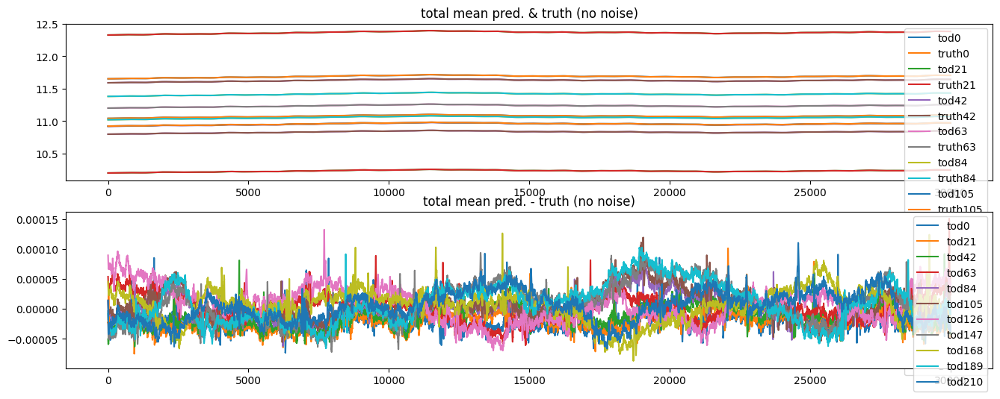

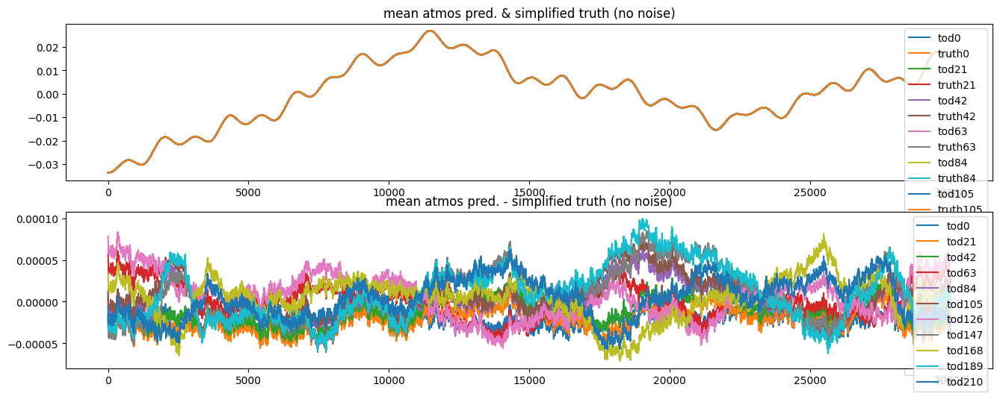

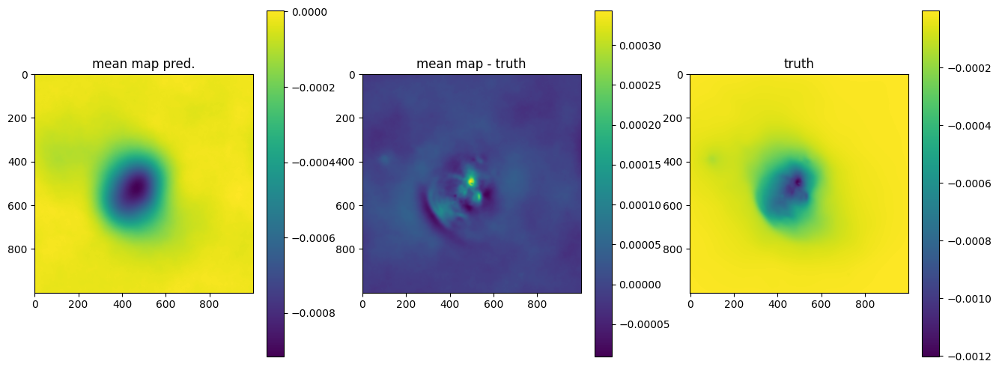

OPTIMIZE_KL: Starting 0025
SL: Iteration 0 ⛰:+4.5635e+08 Δ⛰:inf ➽:1.0601e+01
SL: Iteration 1 ⛰:+9.4298e+07 Δ⛰:3.6206e+08 ➽:1.0601e+01
SL: Iteration 2 ⛰:+6.2086e+07 Δ⛰:3.2212e+07 ➽:1.0601e+01
SL: Iteration 3 ⛰:+4.3624e+07 Δ⛰:1.8462e+07 ➽:1.0601e+01
SL: Iteration 4 ⛰:+1.8329e+07 Δ⛰:2.5295e+07 ➽:1.0601e+01
SL: Iteration 5 ⛰:+8.9346e+06 Δ⛰:9.3947e+06 ➽:1.0601e+01
SL: Iteration 6 ⛰:+6.0508e+06 Δ⛰:2.8838e+06 ➽:1.0601e+01
SL: Iteration 7 ⛰:+4.3880e+06 Δ⛰:1.6628e+06 ➽:1.0601e+01
SL: Iteration 8 ⛰:+3.0780e+06 Δ⛰:1.3101e+06 ➽:1.0601e+01
SL: Iteration 9 ⛰:+2.1310e+06 Δ⛰:9.4694e+05 ➽:1.0601e+01
SL: Iteration 10 ⛰:+1.6774e+06 Δ⛰:4.5357e+05 ➽:1.0601e+01
SL: Iteration 11 ⛰:+1.0507e+06 Δ⛰:6.2678e+05 ➽:1.0601e+01
SL: Iteration 12 ⛰:+9.1669e+05 Δ⛰:1.3397e+05 ➽:1.0601e+01
SL: Iteration 13 ⛰:+7.9733e+05 Δ⛰:1.1936e+05 ➽:1.0601e+01
SL: Iteration 14 ⛰:+7.5517e+05 Δ⛰:4.2162e+04 ➽:1.0601e+01
SL: Iteration 15 ⛰:+5.8366e+05 Δ⛰:1.7151e+05 ➽:1.0601e+01
SL: Iteration 16 ⛰:+4.4903e+05 Δ⛰:1.3463e+05 ➽:1.0601e+01
SL: 

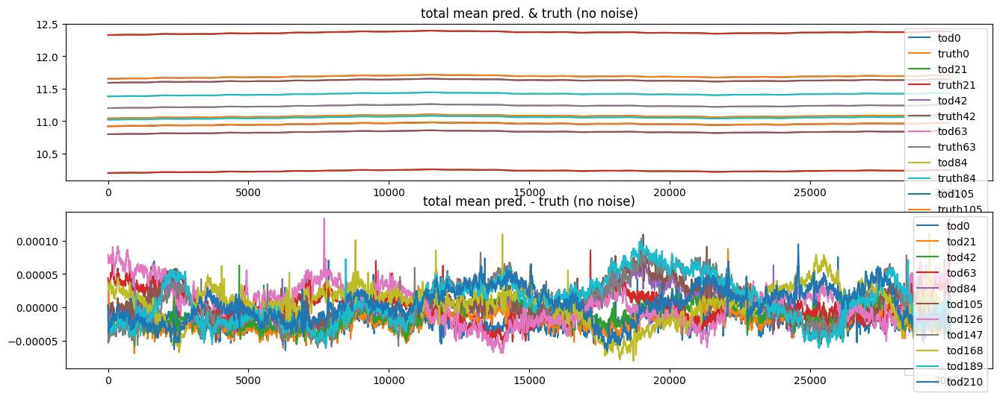

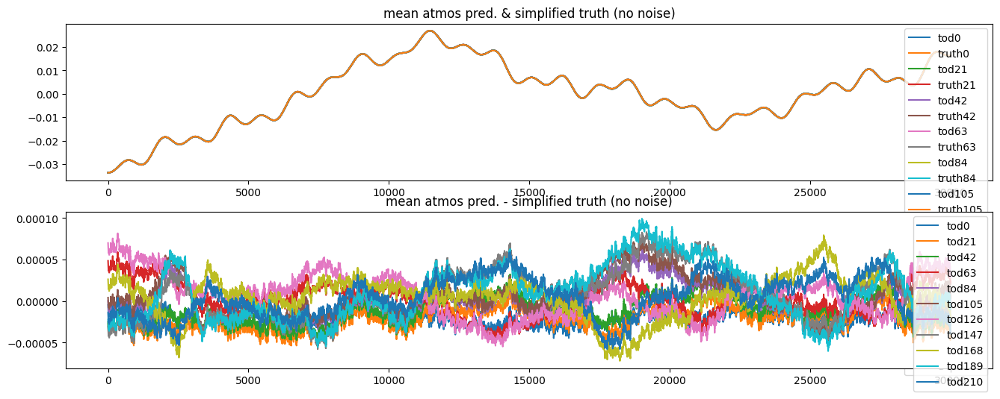

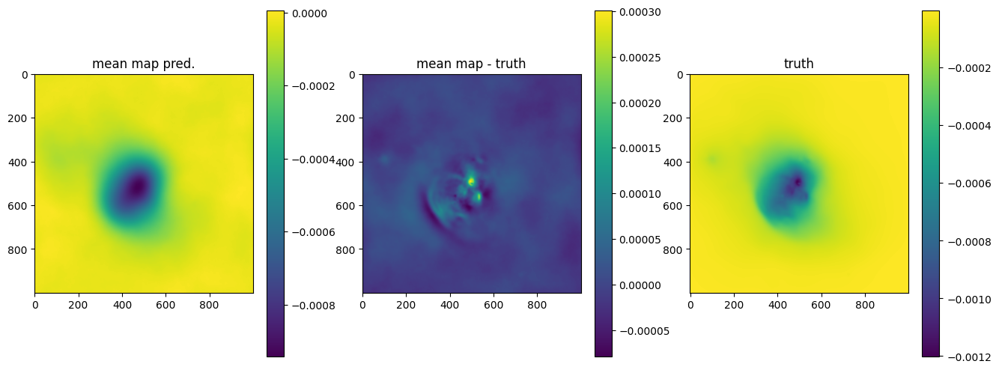

OPTIMIZE_KL: Starting 0028
SL: Iteration 0 ⛰:+1.2630e+08 Δ⛰:inf ➽:1.0601e+01
SL: Iteration 1 ⛰:+4.1642e+07 Δ⛰:8.4660e+07 ➽:1.0601e+01
SL: Iteration 2 ⛰:+2.8203e+07 Δ⛰:1.3439e+07 ➽:1.0601e+01
SL: Iteration 3 ⛰:+2.1211e+07 Δ⛰:6.9926e+06 ➽:1.0601e+01
SL: Iteration 4 ⛰:+1.6227e+07 Δ⛰:4.9842e+06 ➽:1.0601e+01
SL: Iteration 5 ⛰:+6.1984e+06 Δ⛰:1.0028e+07 ➽:1.0601e+01
SL: Iteration 6 ⛰:+4.6213e+06 Δ⛰:1.5771e+06 ➽:1.0601e+01
SL: Iteration 7 ⛰:+3.1129e+06 Δ⛰:1.5084e+06 ➽:1.0601e+01
SL: Iteration 8 ⛰:+2.1529e+06 Δ⛰:9.5995e+05 ➽:1.0601e+01
SL: Iteration 9 ⛰:+1.5872e+06 Δ⛰:5.6575e+05 ➽:1.0601e+01
SL: Iteration 10 ⛰:+1.2555e+06 Δ⛰:3.3167e+05 ➽:1.0601e+01
SL: Iteration 11 ⛰:+7.5099e+05 Δ⛰:5.0451e+05 ➽:1.0601e+01
SL: Iteration 12 ⛰:+6.0783e+05 Δ⛰:1.4316e+05 ➽:1.0601e+01
SL: Iteration 13 ⛰:+6.0278e+05 Δ⛰:5.0471e+03 ➽:1.0601e+01
SL: Iteration 14 ⛰:+4.3325e+05 Δ⛰:1.6953e+05 ➽:1.0601e+01
SL: Iteration 15 ⛰:+4.3092e+05 Δ⛰:2.3332e+03 ➽:1.0601e+01
SL: Iteration 16 ⛰:+2.1852e+05 Δ⛰:2.1240e+05 ➽:1.0601e+01
SL: 

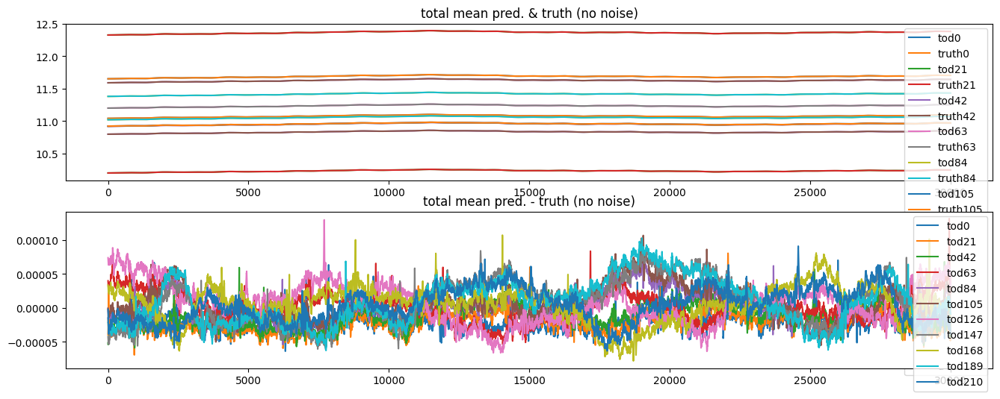

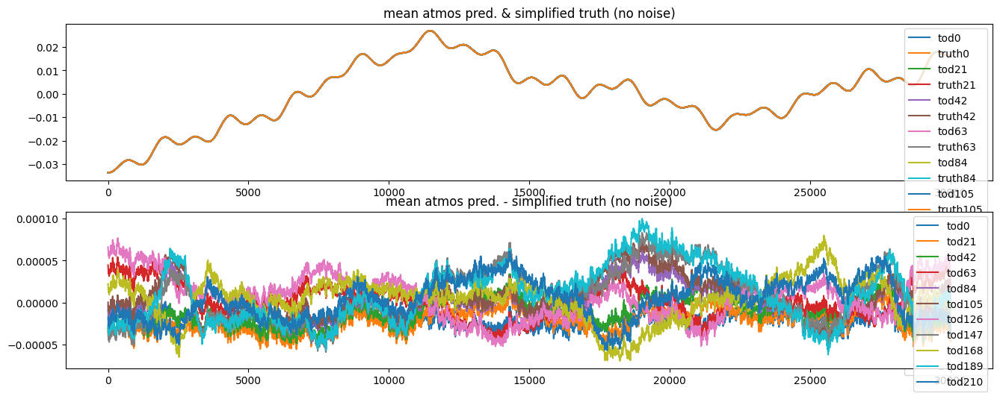

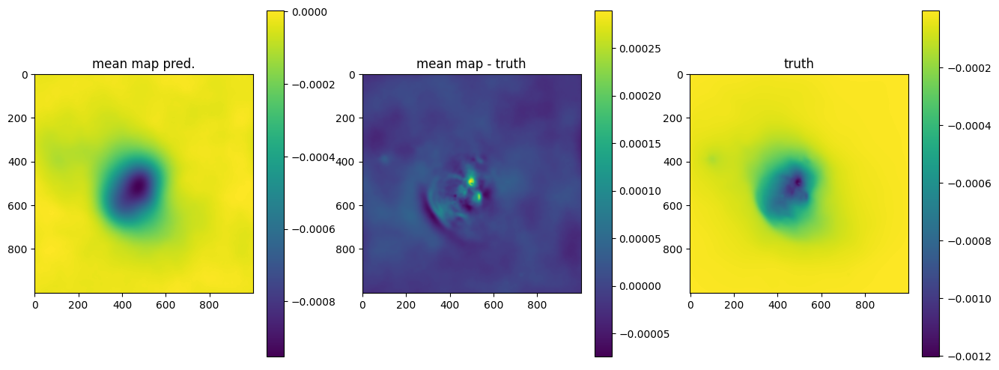

In [10]:
samples, state = fit.perform_fit(n_it=30, printevery=3)
# samples, state = fit.perform_fit(n_it=1, printevery=3)

In [11]:
fit.printfitresults(samples)

Fit Results (res, init, std)

TODs:
	fluctuations: 0.0015103549202039343, 0.0015, 0.0001
	loglogvarslope: -2.4890977354114634, -2.45, 0.1
	zeromode std (LogNormal): 6.847583046096004e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.4061699199267674e-05, 5.6e-05, 1e-06
	loglogvarslope: -3.361547667636517, -2.5, 0.1
	zeromode std (LogNormal): 8.890754855167508e-10, 1e-08, 1e-07


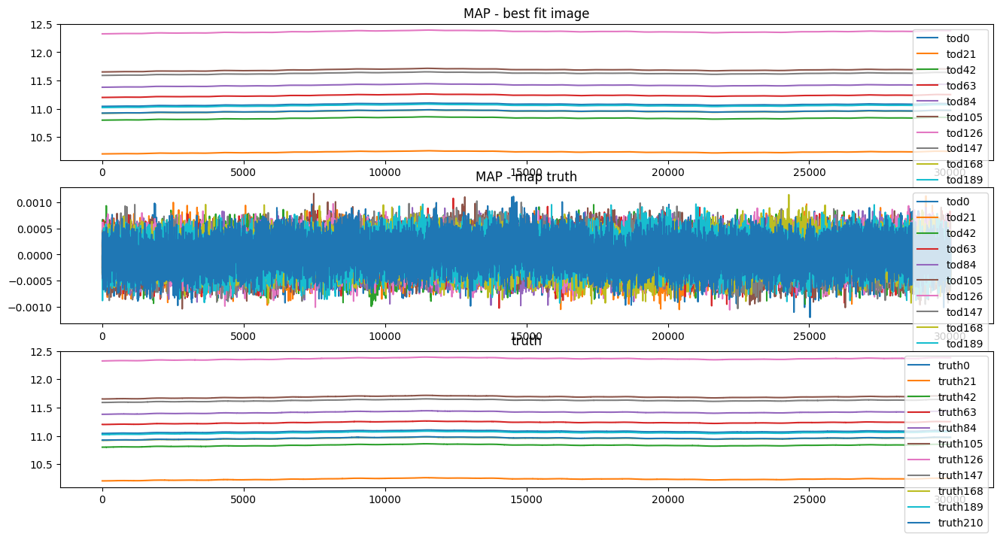

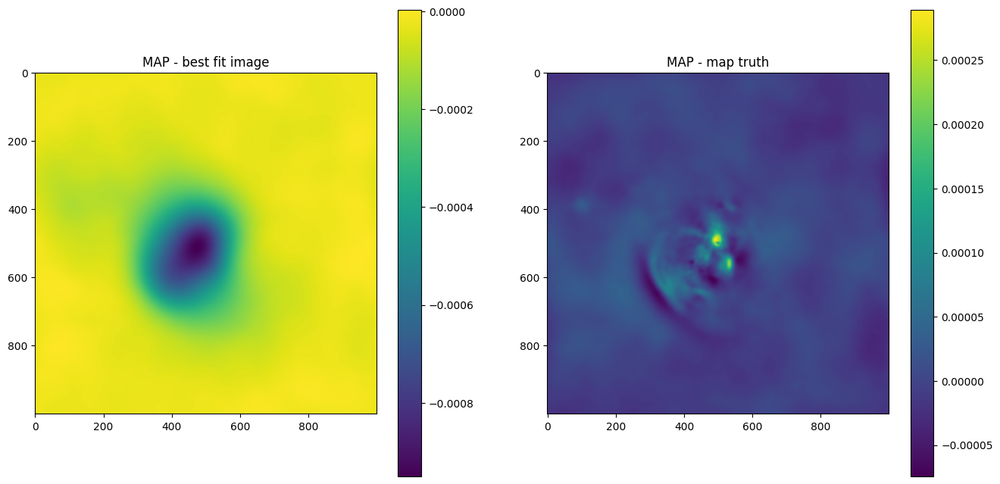

In [12]:
fit.plotfitresults(samples)

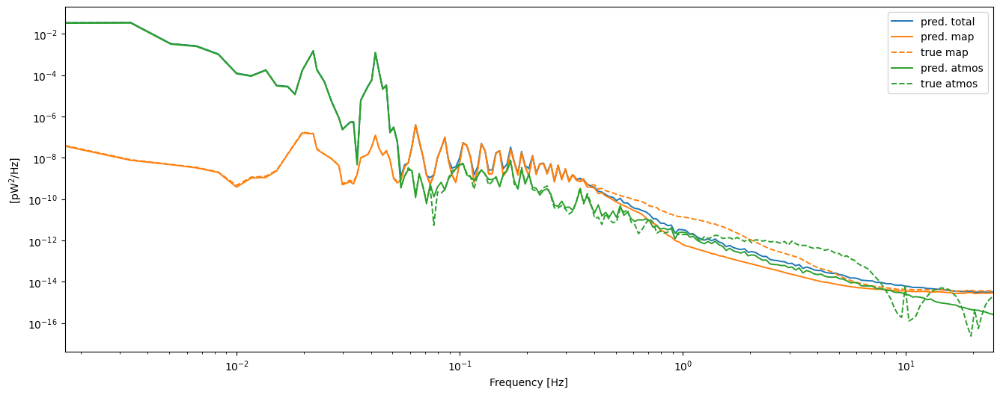

In [13]:
fit.plotpowerspectrum(samples)

# Extend det to two halves:

In [14]:
fit.init_gps(n_sub=2, samples=samples)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


(2, 217)
Will initialise GPs for atmosphere in 2 parts based on samples.
Initialised gp_tod: Model(
	<function CFM.finalize.<locals>.correlated_field at 0x151a06c53380>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(2, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x15214ecaa480>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x15214ecaa480>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x15214ecaa480>, primals=ShapeWithDtype(shape=(2, 40000), dtype=<class 'ja

In [15]:
samples, state = fit.perform_fit(n_it=2, printevery=4)

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+4.7405e+08 Δ⛰:inf ➽:1.1001e+01
SL: Iteration 1 ⛰:+6.9720e+07 Δ⛰:4.0433e+08 ➽:1.1001e+01
SL: Iteration 2 ⛰:+4.1249e+07 Δ⛰:2.8470e+07 ➽:1.1001e+01
SL: Iteration 3 ⛰:+2.9083e+07 Δ⛰:1.2167e+07 ➽:1.1001e+01
SL: Iteration 4 ⛰:+1.4358e+07 Δ⛰:1.4724e+07 ➽:1.1001e+01
SL: Iteration 5 ⛰:+1.2564e+07 Δ⛰:1.7941e+06 ➽:1.1001e+01
SL: Iteration 6 ⛰:+7.7293e+06 Δ⛰:4.8347e+06 ➽:1.1001e+01
SL: Iteration 7 ⛰:+6.7257e+06 Δ⛰:1.0036e+06 ➽:1.1001e+01
SL: Iteration 8 ⛰:+5.4808e+06 Δ⛰:1.2449e+06 ➽:1.1001e+01
SL: Iteration 9 ⛰:+3.5873e+06 Δ⛰:1.8935e+06 ➽:1.1001e+01
SL: Iteration 10 ⛰:+3.0576e+06 Δ⛰:5.2967e+05 ➽:1.1001e+01
SL: Iteration 11 ⛰:+1.9310e+06 Δ⛰:1.1266e+06 ➽:1.1001e+01
SL: Iteration 12 ⛰:+1.6286e+06 Δ⛰:3.0243e+05 ➽:1.1001e+01
SL: Iteration 13 ⛰:+1.2274e+06 Δ⛰:4.0123e+05 ➽:1.1001e+01
SL: Iteration 14 ⛰:+7.1144e+05 Δ⛰:5.1594e+05 ➽:1.1001e+01
SL: Iteration 15 ⛰:+7.0231e+05 Δ⛰:9.1342e+03 ➽:1.1001e+01
SL: Iteration 16 ⛰:+4.9364e+05 Δ⛰:2.0867e+05 ➽:1.1001e+01
SL: 

In [16]:
fit.printfitresults(samples)

Fit Results (res, init, std)

TODs:
	fluctuations: 0.0015105595516377557, 0.0015, 0.0001
	loglogvarslope: -2.4891644348404682, -2.45, 0.1
	zeromode std (LogNormal): 6.40256978220836e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.406163622234837e-05, 5.6e-05, 1e-06
	loglogvarslope: -3.3615758615721445, -2.5, 0.1
	zeromode std (LogNormal): 8.890824011938608e-10, 1e-08, 1e-07


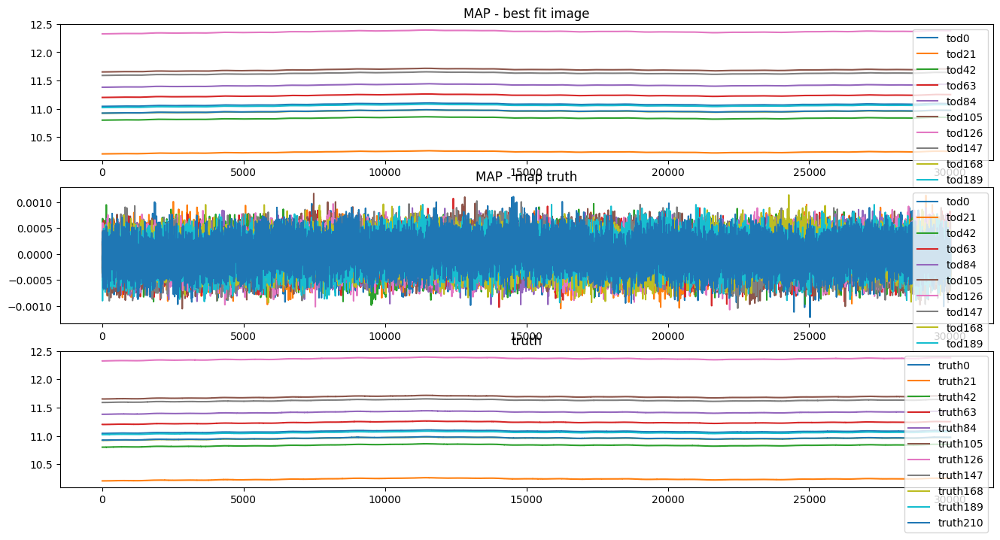

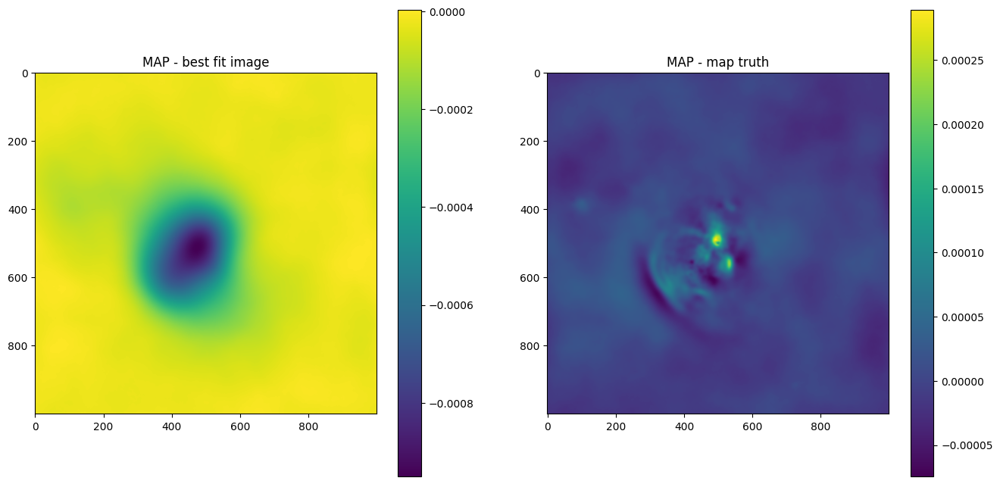

In [17]:
fit.plotfitresults(samples)

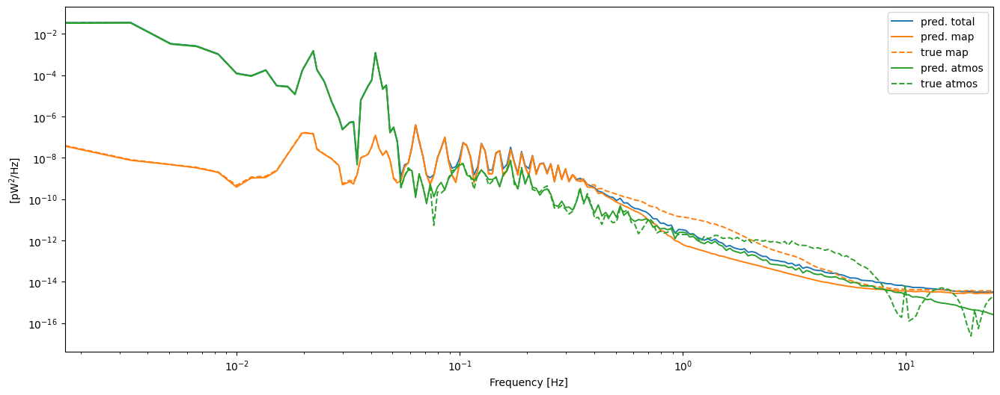

In [18]:
fit.plotpowerspectrum(samples)

# Four GPs with halved x-dir

In [19]:
fit.init_gps(n_sub=4, samples=samples)

(2, 217)
Will initialise GPs for atmosphere in 4 parts based on samples.
Initialised gp_tod: Model(
	<function CFM.finalize.<locals>.correlated_field at 0x1519aa01a340>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(4, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x15214ecaa480>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x15214ecaa480>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x15214ecaa480>, primals=ShapeWithDtype(shape=(4, 40000), dtype=<class 'ja

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


(217, 30000)


Array([[11.07668506, 11.07667846, 11.07667302, ..., 11.0755131 ,
        11.07550869, 11.07550301],
       [11.11235445, 11.11235318, 11.11235351, ..., 11.11541768,
        11.11541627, 11.11541317],
       [10.59279394, 10.59279082, 10.59278746, ..., 10.59167455,
        10.59167292, 10.59166952],
       ...,
       [11.07334253, 11.07334725, 11.07335096, ..., 11.07467721,
        11.07467888, 11.07468224],
       [11.92563654, 11.92564048, 11.92564357, ..., 11.92695654,
        11.92695809, 11.92696108],
       [10.654219  , 10.65421553, 10.65421685, ..., 10.65501707,
        10.65501944, 10.65502138]], dtype=float64)

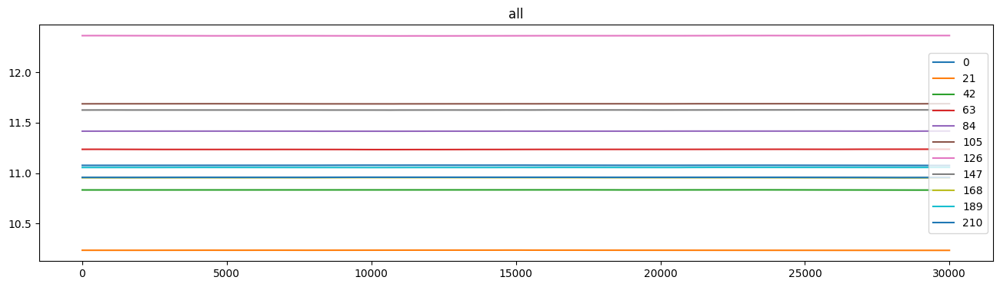

In [20]:
fit.draw_prior_sample()

In [21]:
samples, state = fit.perform_fit(n_it=2, printevery=4)

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+4.5571e+08 Δ⛰:inf ➽:1.1801e+01
SL: Iteration 1 ⛰:+1.7694e+08 Δ⛰:2.7877e+08 ➽:1.1801e+01
SL: Iteration 2 ⛰:+4.2343e+07 Δ⛰:1.3460e+08 ➽:1.1801e+01
SL: Iteration 3 ⛰:+2.7623e+07 Δ⛰:1.4720e+07 ➽:1.1801e+01
SL: Iteration 4 ⛰:+1.5976e+07 Δ⛰:1.1648e+07 ➽:1.1801e+01
SL: Iteration 5 ⛰:+1.1045e+07 Δ⛰:4.9303e+06 ➽:1.1801e+01
SL: Iteration 6 ⛰:+9.5456e+06 Δ⛰:1.4998e+06 ➽:1.1801e+01
SL: Iteration 7 ⛰:+7.7665e+06 Δ⛰:1.7791e+06 ➽:1.1801e+01
SL: Iteration 8 ⛰:+5.9077e+06 Δ⛰:1.8588e+06 ➽:1.1801e+01
SL: Iteration 9 ⛰:+4.5784e+06 Δ⛰:1.3292e+06 ➽:1.1801e+01
SL: Iteration 10 ⛰:+4.0524e+06 Δ⛰:5.2603e+05 ➽:1.1801e+01
SL: Iteration 11 ⛰:+3.2481e+06 Δ⛰:8.0436e+05 ➽:1.1801e+01
SL: Iteration 12 ⛰:+2.9424e+06 Δ⛰:3.0561e+05 ➽:1.1801e+01
SL: Iteration 13 ⛰:+2.1397e+06 Δ⛰:8.0279e+05 ➽:1.1801e+01
SL: Iteration 14 ⛰:+2.0344e+06 Δ⛰:1.0527e+05 ➽:1.1801e+01
SL: Iteration 15 ⛰:+1.8708e+06 Δ⛰:1.6357e+05 ➽:1.1801e+01
SL: Iteration 16 ⛰:+1.6264e+06 Δ⛰:2.4445e+05 ➽:1.1801e+01
SL: 

In [22]:
fit.printfitresults(samples)

Fit Results (res, init, std)

TODs:
	fluctuations: 0.0015106886332358757, 0.0015, 0.0001
	loglogvarslope: -2.489722303604177, -2.45, 0.1
	zeromode std (LogNormal): 6.352571695641009e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.406135122208699e-05, 5.6e-05, 1e-06
	loglogvarslope: -3.3616562296593138, -2.5, 0.1
	zeromode std (LogNormal): 8.8907457301319e-10, 1e-08, 1e-07


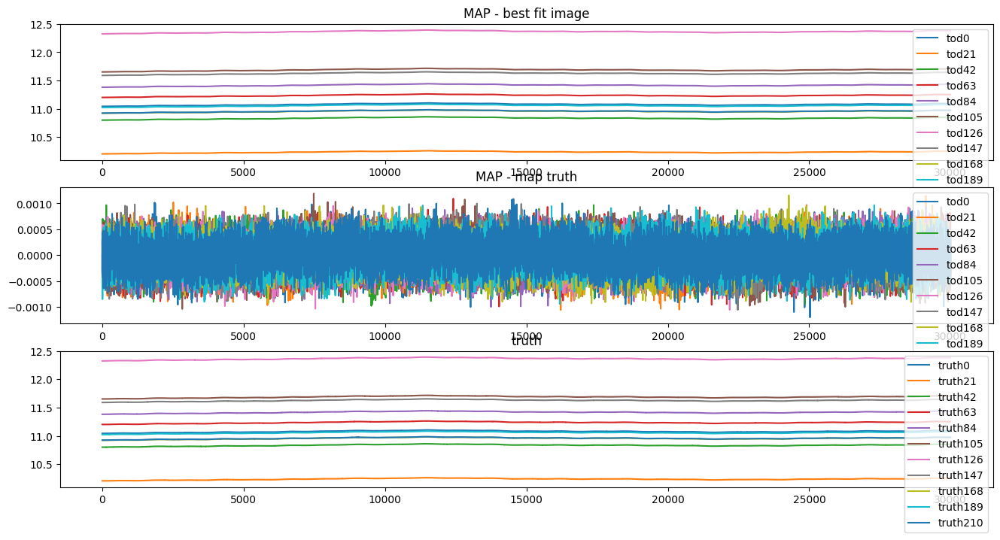

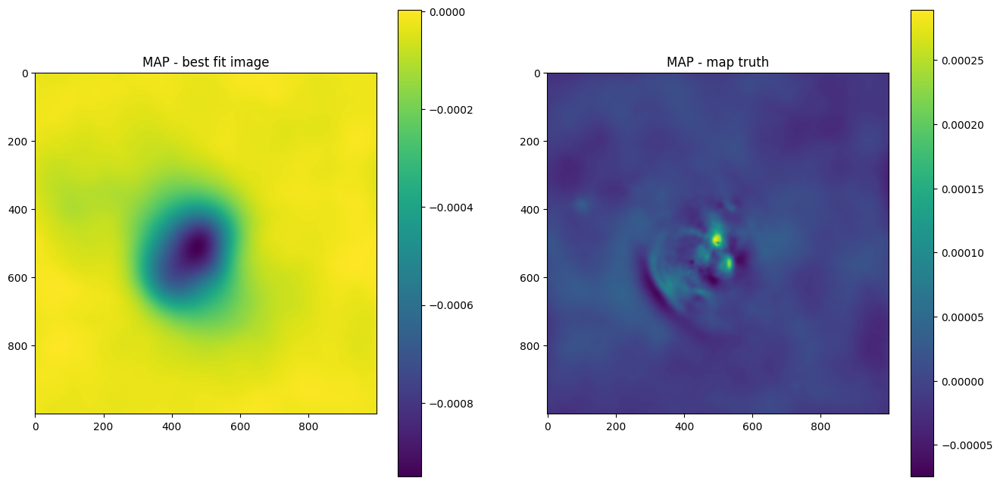

In [23]:
fit.plotfitresults(samples)

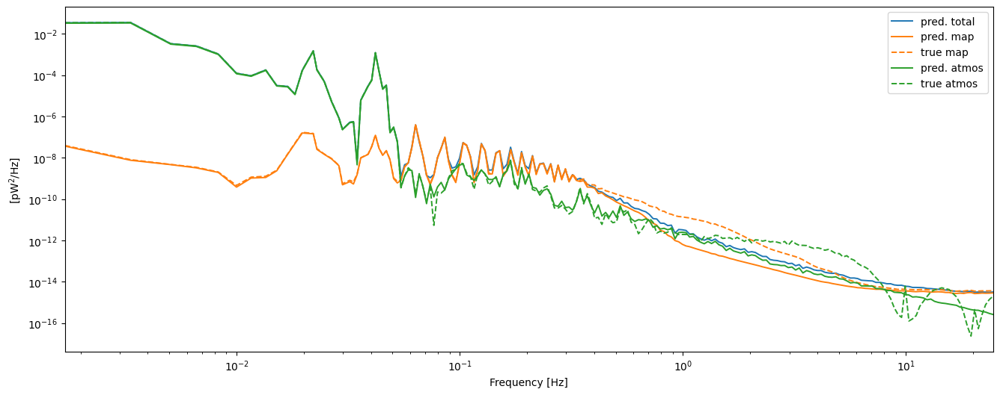

In [24]:
fit.plotpowerspectrum(samples)

# All dets.

In [25]:
fit.init_gps(n_sub=-1, samples=samples)

(2, 217)
Will initialise GPs for atmosphere in -1 parts based on samples.


assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


Initialised gp_tod: Model(
	<function CFM.finalize.<locals>.correlated_field at 0x1519f8a35940>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x15214ecaa480>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x15214ecaa480>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x15214ecaa480>, primals=ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>)),
		 'combcf zeromode': functools.partial(<functio

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+2.4290e+08 Δ⛰:inf ➽:9.7001e+01
SL: Iteration 1 ⛰:+2.1703e+08 Δ⛰:2.5873e+07 ➽:9.7001e+01
SL: Iteration 2 ⛰:+1.9464e+08 Δ⛰:2.2393e+07 ➽:9.7001e+01
SL: Iteration 3 ⛰:+4.3389e+07 Δ⛰:1.5125e+08 ➽:9.7001e+01
SL: Iteration 4 ⛰:+2.7819e+07 Δ⛰:1.5571e+07 ➽:9.7001e+01
SL: Iteration 5 ⛰:+1.5443e+07 Δ⛰:1.2376e+07 ➽:9.7001e+01
SL: Iteration 6 ⛰:+9.1131e+06 Δ⛰:6.3294e+06 ➽:9.7001e+01
SL: Iteration 7 ⛰:+7.6087e+06 Δ⛰:1.5043e+06 ➽:9.7001e+01
SL: Iteration 8 ⛰:+7.4593e+06 Δ⛰:1.4938e+05 ➽:9.7001e+01
SL: Iteration 9 ⛰:+4.5368e+06 Δ⛰:2.9226e+06 ➽:9.7001e+01
SL: Iteration 10 ⛰:+2.3452e+06 Δ⛰:2.1916e+06 ➽:9.7001e+01
SL: Iteration 11 ⛰:+1.7717e+06 Δ⛰:5.7347e+05 ➽:9.7001e+01
SL: Iteration 12 ⛰:+1.7416e+06 Δ⛰:3.0110e+04 ➽:9.7001e+01
SL: Iteration 13 ⛰:+9.2443e+05 Δ⛰:8.1717e+05 ➽:9.7001e+01
SL: Iteration 14 ⛰:+3.0575e+05 Δ⛰:6.1868e+05 ➽:9.7001e+01
SL: Iteration 15 ⛰:+2.2972e+04 Δ⛰:2.8277e+05 ➽:9.7001e+01
SL: Iteration 16 ⛰:-4.5223e+04 Δ⛰:6.8195e+04 ➽:9.7001e+01
SL: 

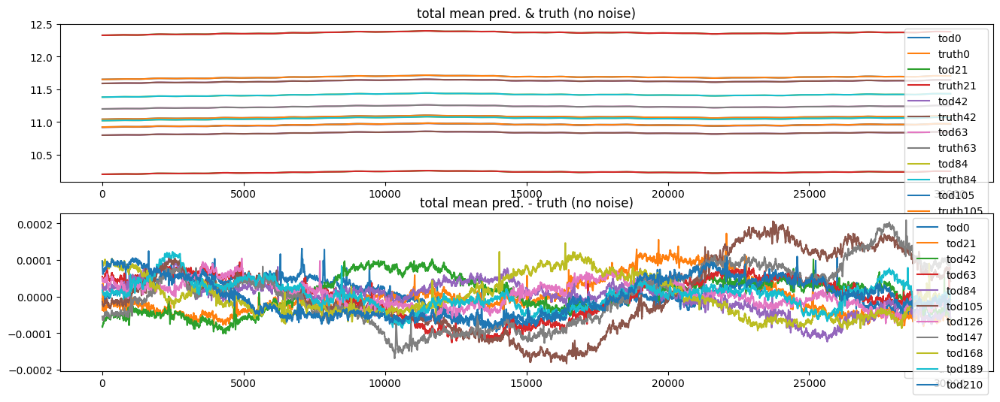

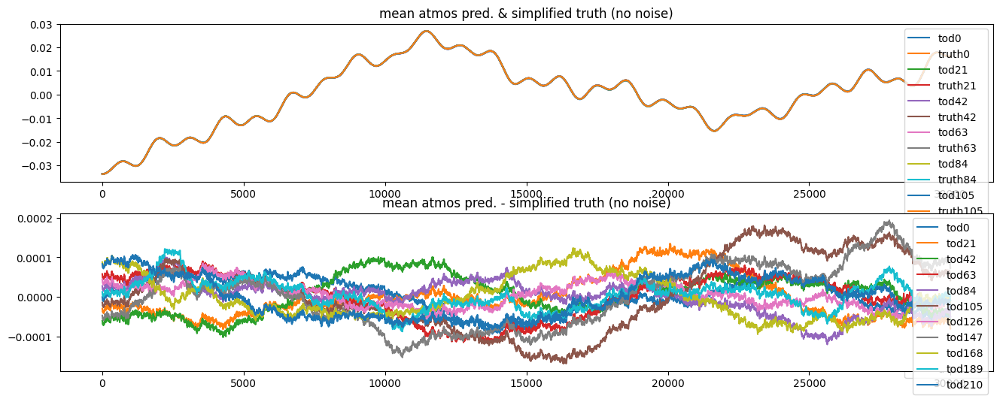

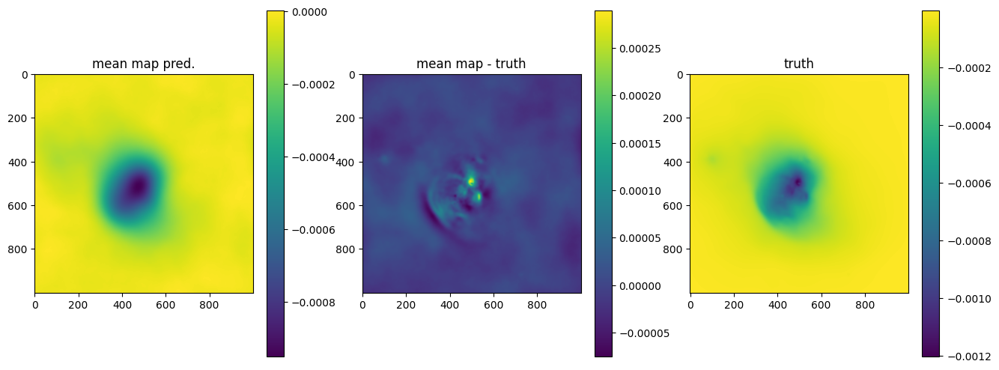

OPTIMIZE_KL: Starting 0002
SL: Iteration 0 ⛰:+2.5086e+08 Δ⛰:inf ➽:9.7001e+01
SL: Iteration 1 ⛰:+2.1856e+08 Δ⛰:3.2293e+07 ➽:9.7001e+01
SL: Iteration 2 ⛰:+1.8748e+08 Δ⛰:3.1084e+07 ➽:9.7001e+01
SL: Iteration 3 ⛰:+4.4261e+07 Δ⛰:1.4322e+08 ➽:9.7001e+01
SL: Iteration 4 ⛰:+2.7882e+07 Δ⛰:1.6379e+07 ➽:9.7001e+01
SL: Iteration 5 ⛰:+1.5368e+07 Δ⛰:1.2514e+07 ➽:9.7001e+01
SL: Iteration 6 ⛰:+9.0433e+06 Δ⛰:6.3250e+06 ➽:9.7001e+01
SL: Iteration 7 ⛰:+7.4085e+06 Δ⛰:1.6348e+06 ➽:9.7001e+01
SL: Iteration 8 ⛰:+7.3953e+06 Δ⛰:1.3168e+04 ➽:9.7001e+01
SL: Iteration 9 ⛰:+4.8008e+06 Δ⛰:2.5945e+06 ➽:9.7001e+01
SL: Iteration 10 ⛰:+2.5429e+06 Δ⛰:2.2579e+06 ➽:9.7001e+01
SL: Iteration 11 ⛰:+1.8352e+06 Δ⛰:7.0777e+05 ➽:9.7001e+01
SL: Iteration 12 ⛰:+1.7927e+06 Δ⛰:4.2475e+04 ➽:9.7001e+01
SL: Iteration 13 ⛰:+1.1762e+06 Δ⛰:6.1643e+05 ➽:9.7001e+01
SL: Iteration 14 ⛰:+4.9932e+05 Δ⛰:6.7692e+05 ➽:9.7001e+01
SL: Iteration 15 ⛰:+4.6003e+05 Δ⛰:3.9296e+04 ➽:9.7001e+01
SL: Iteration 16 ⛰:+1.0071e+05 Δ⛰:3.5932e+05 ➽:9.7001e+01
SL: 

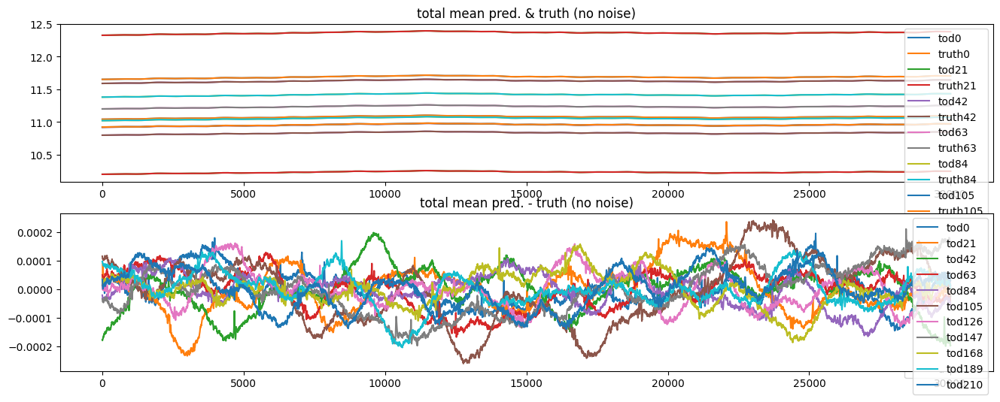

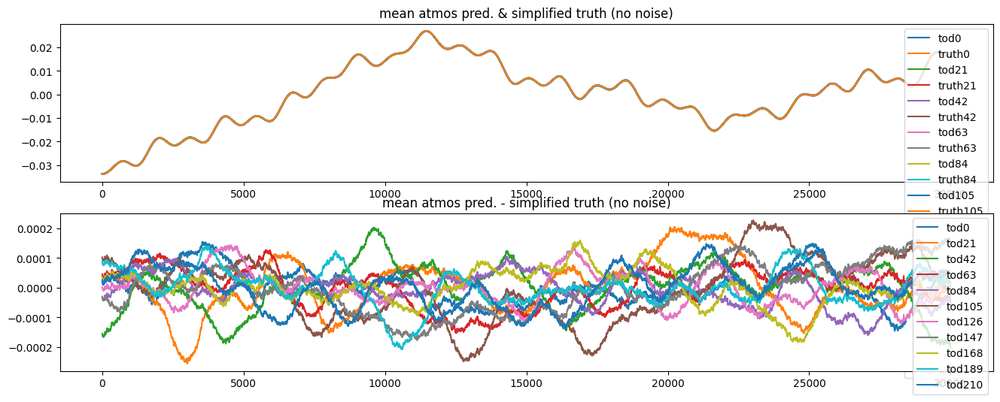

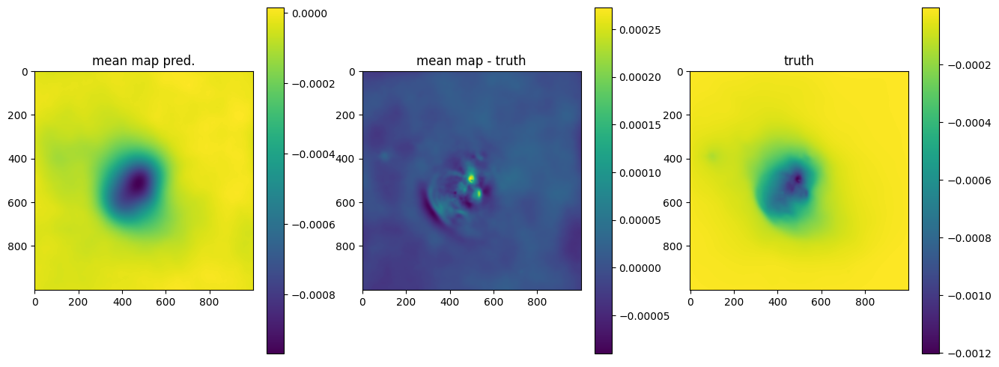

In [26]:
samples, state = fit.perform_fit(n_it=2, printevery=1)

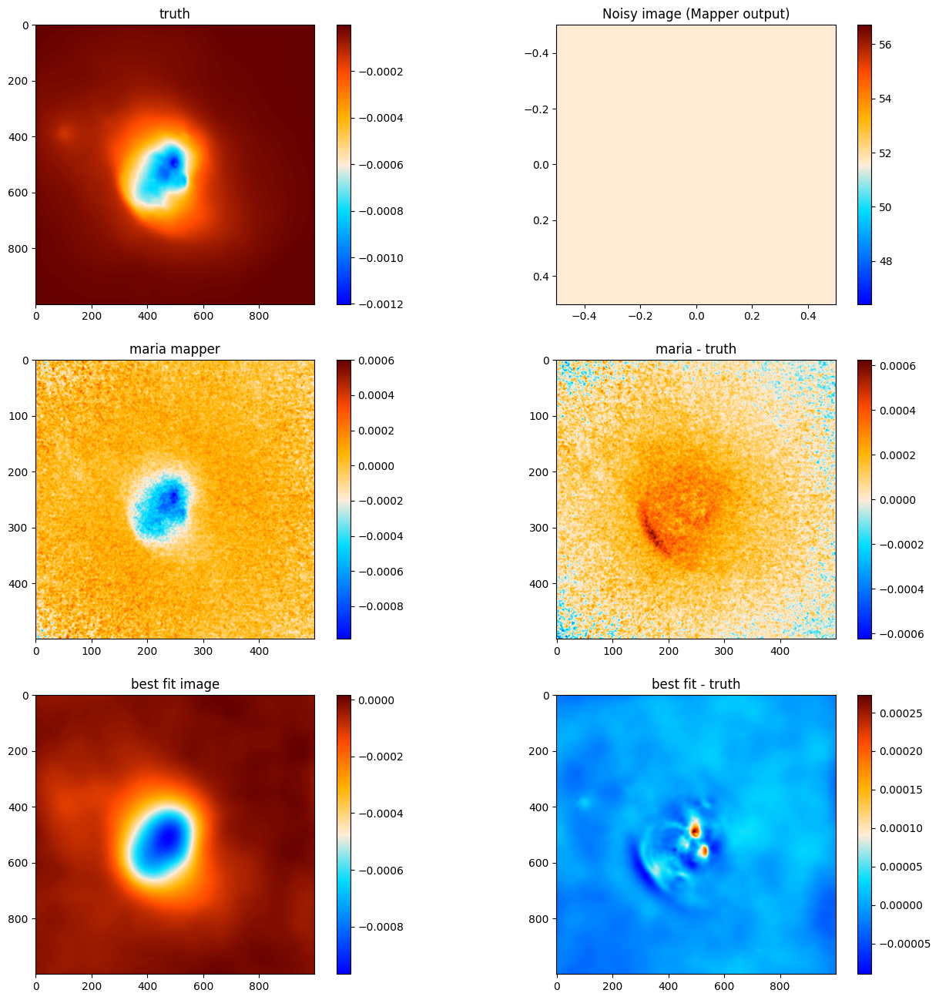

In [27]:
fit.plotrecos(samples)